# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [2]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine
print("done")

  Using cached plotnine-0.13.0-py3-none-any.whl (1.3 MB)
  Using cached mizani-0.11.0-py3-none-any.whl (114 kB)
  Using cached statsmodels-0.14.1-cp310-cp310-win_amd64.whl (9.8 MB)
     ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/46.2 MB ? eta -:--:--
     --------------------------------------- 0.0/46.2 MB 119.8 kB/s eta 0:06:26
     --------------------------------------- 0.0/46.2 MB 119.8 kB/s eta 0:06:26
     --------------------------------------- 0.0/46.2 MB 119.8 kB/s eta 0:06:26
     --------------------------------------- 0.0/46.2 MB 119.8 kB/s eta 0:06:26
     --------------------------------------- 0.0/46.2 MB 119.8 kB/s eta 0:06:26
     --------------------------------------- 0.0/46.2 MB 11


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\jessi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [6]:
!pip install seaborn
!pip install scikit-learn



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\jessi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.0/10.6 MB 119.1 kB/s eta 0:01:29
     --------------------------------------- 0.1/10.6 MB 113.0 kB/s eta 0:01:34
     ---


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\jessi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Running this project require the following imports 

In [17]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [7]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



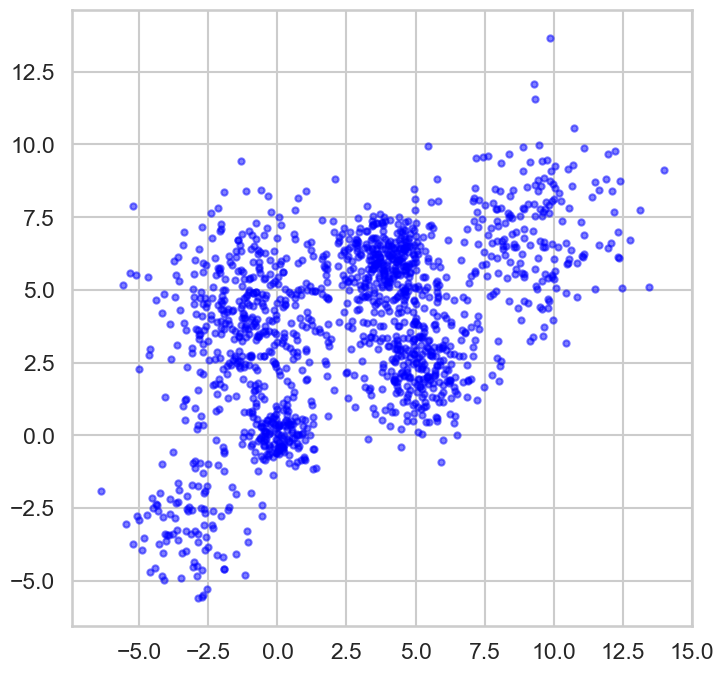

In [29]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

Best value of K based on silhouette score: 5
Silhouette score for the best K: 0.4810257429390806


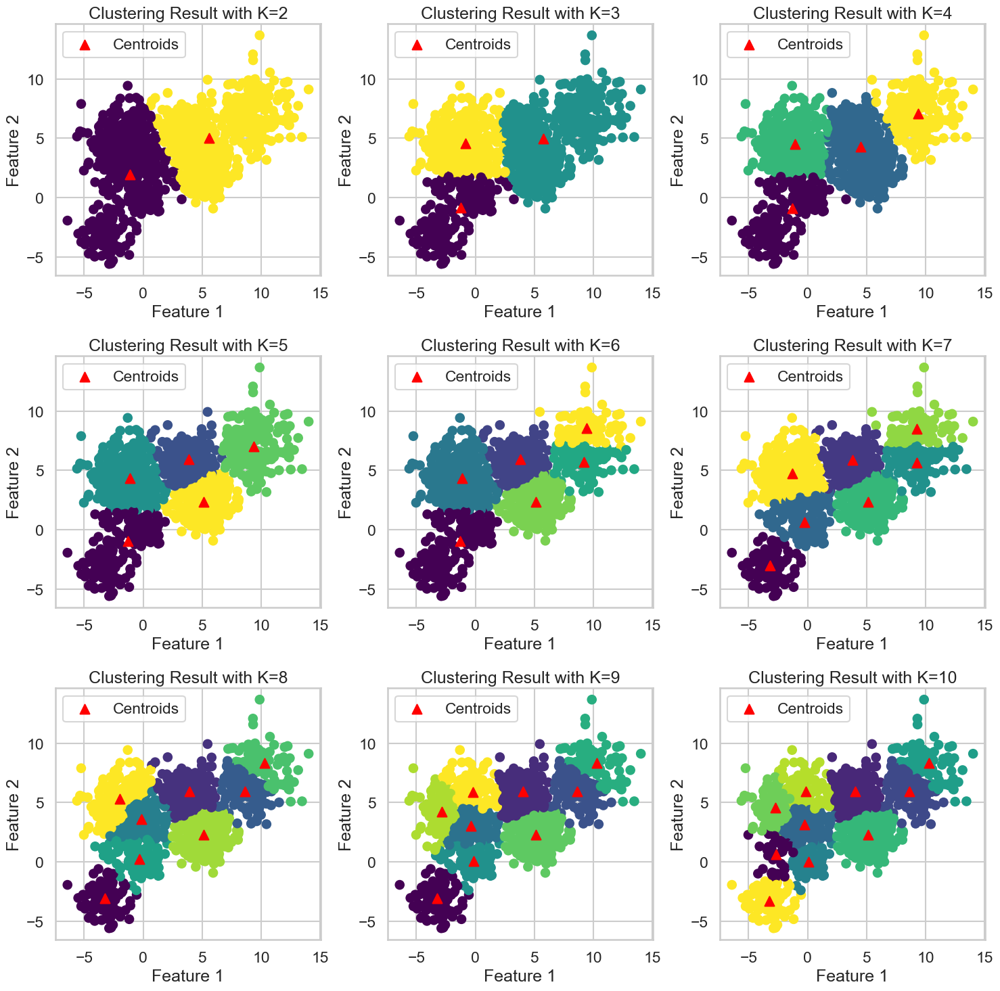

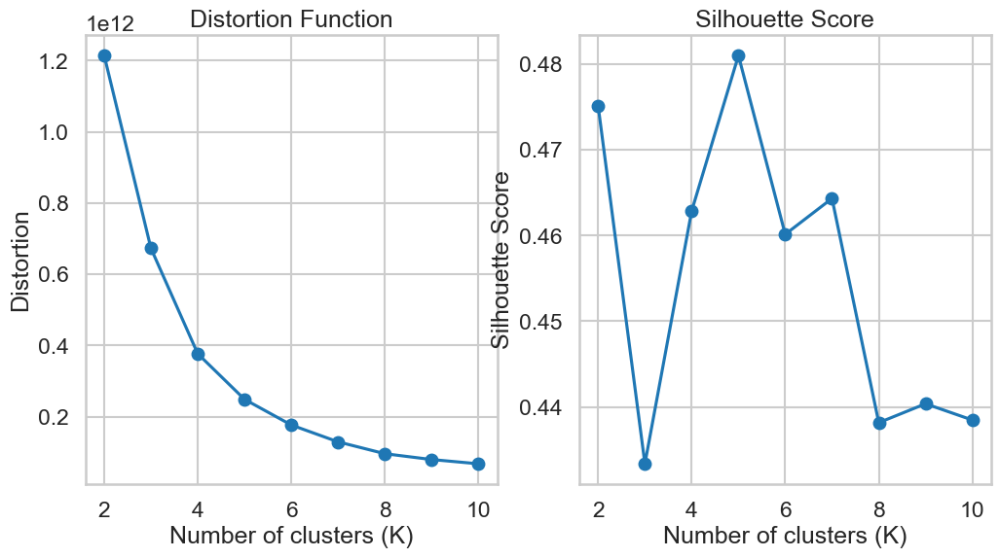

In [92]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

k_values = range(2, 11)  # Stores range of k values
silhouette_scores = []  # Stores silhouette score for each k value 

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, k in enumerate(k_values):
    # Initialize and fit KMeans clustering model
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(Multi_blob_Data)
    
    # Compute silhouette score
    silhouette_scores.append(silhouette_score(Multi_blob_Data, kmeans.labels_))
    
    # Plot the clustering outcome for each value of K
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=kmeans.labels_, cmap='viridis')
    ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='^', s=100, c='red', label='Centroids')
    ax.set_title(f'Clustering Result with K={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.legend()

# Adjust layout
plt.tight_layout()

# Plot distortion function versus K
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(k_values, distortions, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Distortion')
plt.title('Distortion Function')

# Plot silhouette score versus K
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

# Choose the best value of K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print("Best value of K based on silhouette score:", best_k)

# Store the silhouette score for the best K
best_silhouette_score = max(silhouette_scores)
print("Silhouette score for the best K:", best_silhouette_score)

plt.show()


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

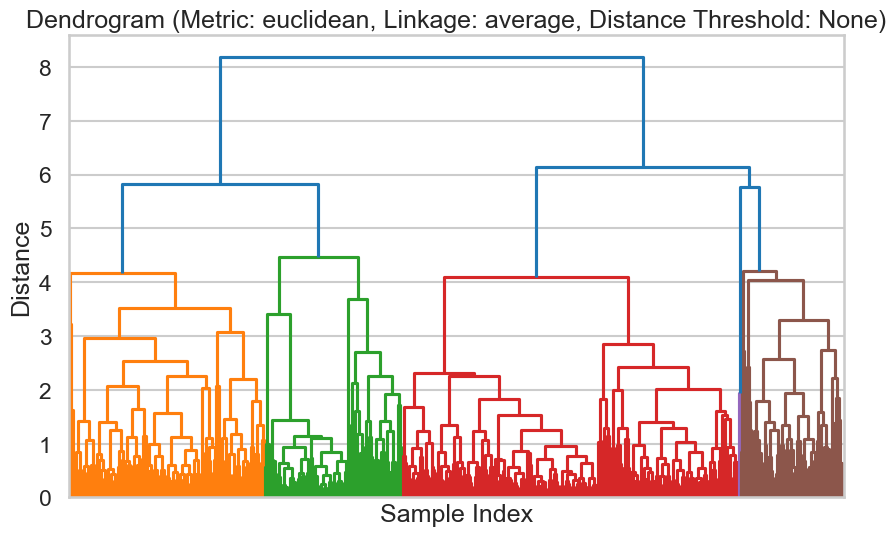

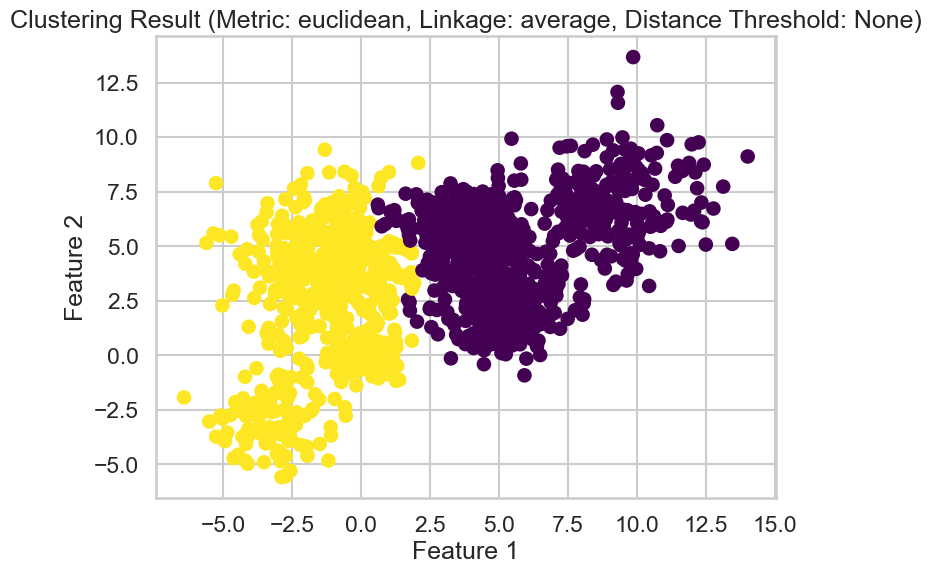

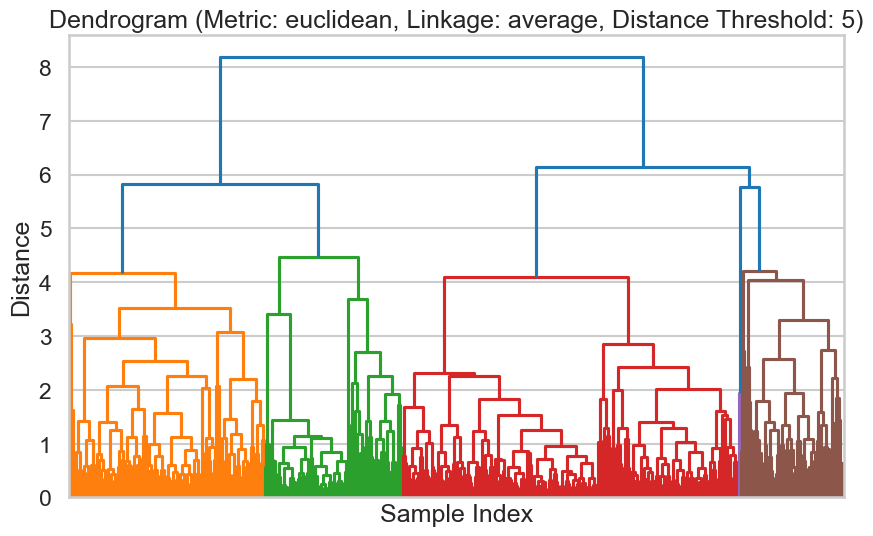

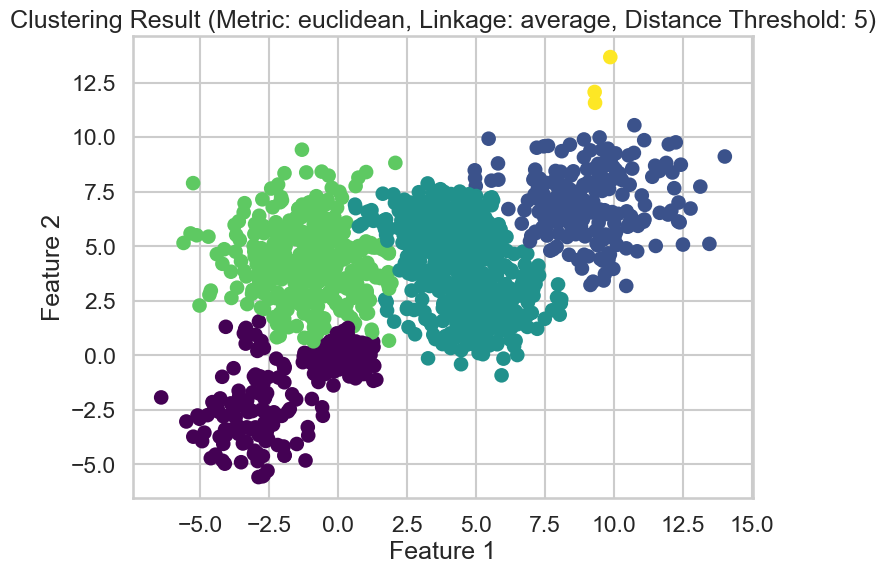

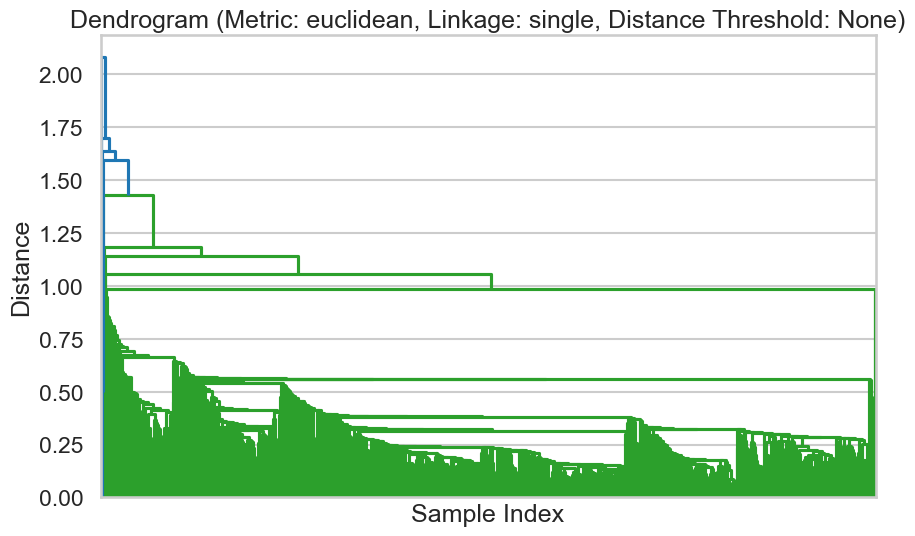

...

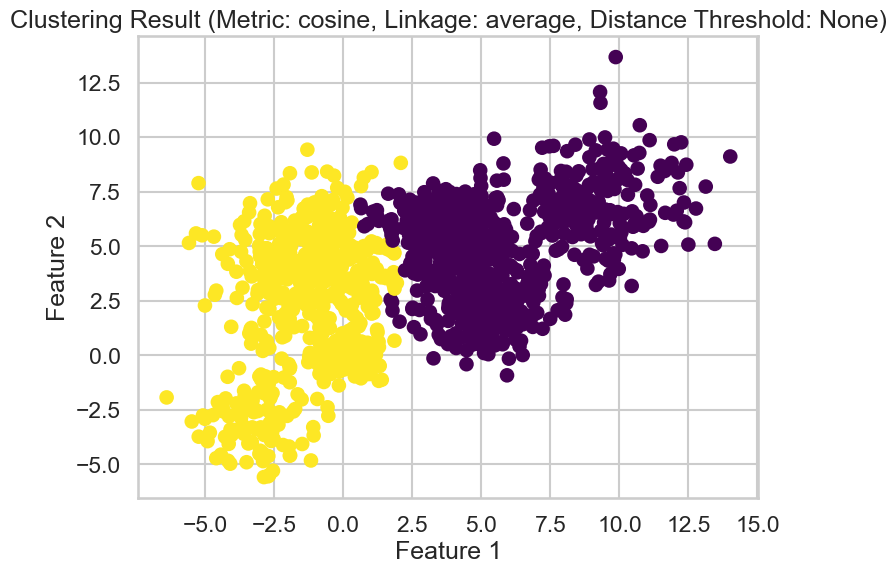

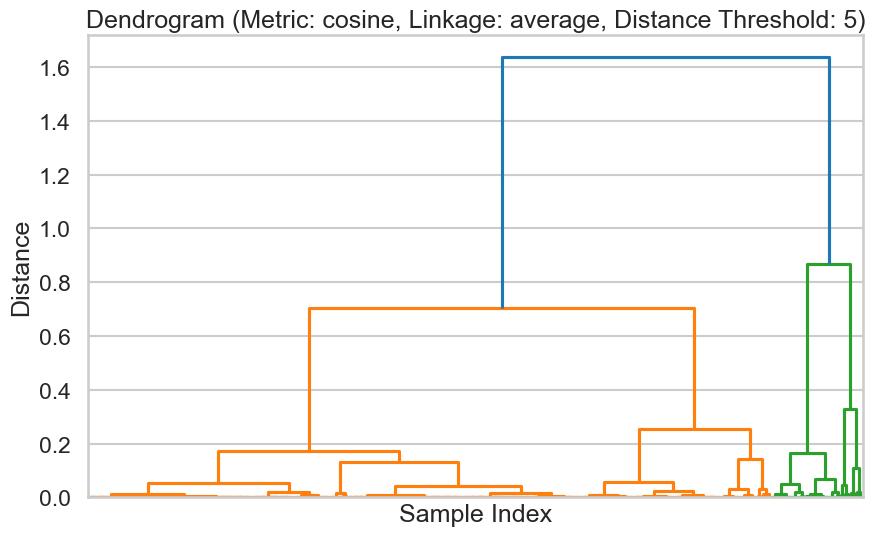

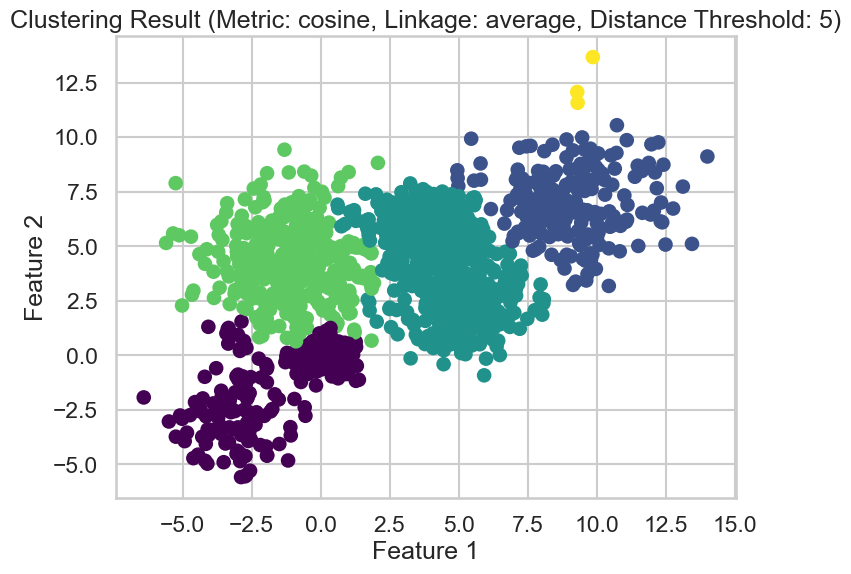

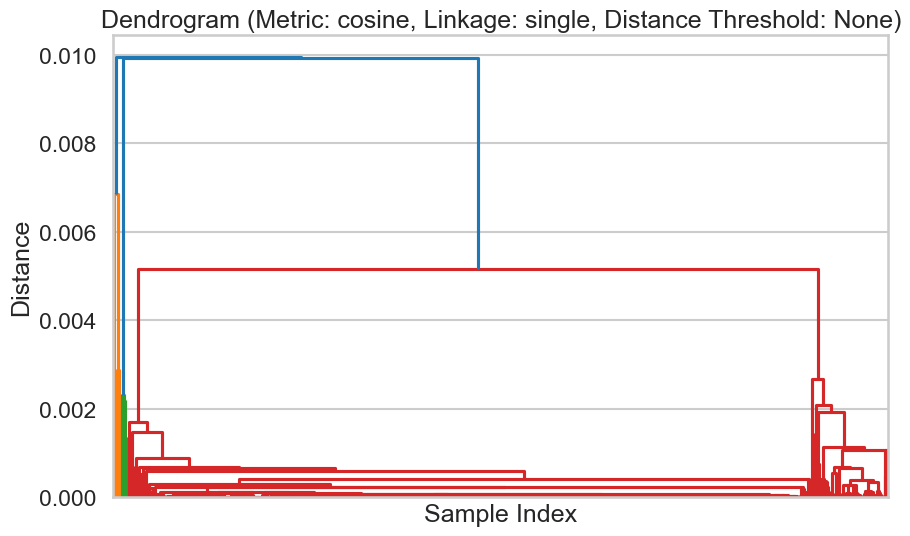

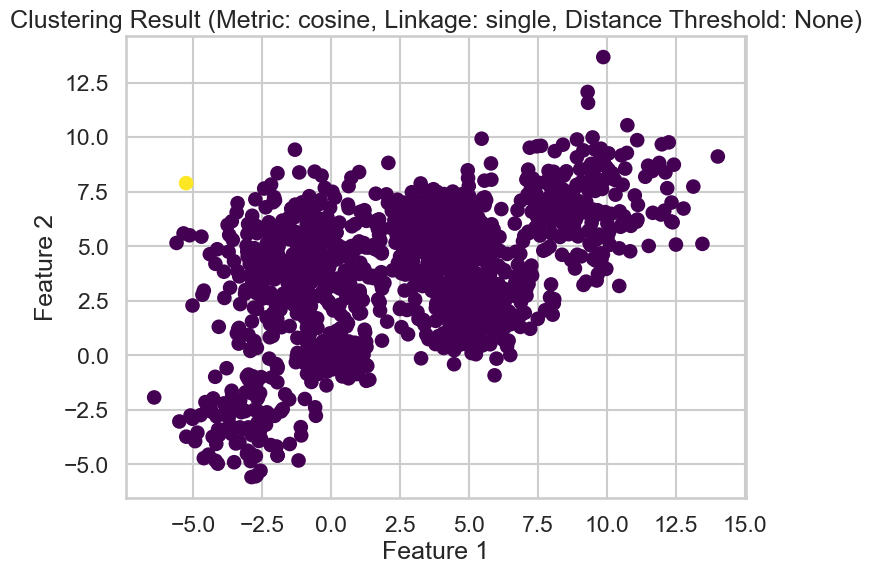

Best parameters: {'Metric': 'euclidean', 'Linkage': 'average', 'Distance Threshold': None}
Best silhouette score: 0.4716908069861964


In [45]:
# Initialize best silhouette score and parameters
best_silhouette_score = -1
best_params = {}

# Define parameters to try
metrics = ['euclidean', 'cityblock', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [None, 5]

# Iterate over different combinations of parameters
for metric in metrics:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            # Create AgglomerativeClustering model with specified parameters
            if distance_threshold is None:
                model = AgglomerativeClustering(linkage=linkage_method)
            else:
                model = AgglomerativeClustering(n_clusters=None, linkage=linkage_method, distance_threshold=distance_threshold)

            # Fit the model and predict labels
            labels = model.fit_predict(Multi_blob_Data)

            # Ensure there are more than 1 unique label
            if len(set(labels)) < 2:
                continue

            # Calculate silhouette score
            silhouette_score_value = silhouette_score(Multi_blob_Data, labels)

            # Compute linkage matrix
            Z = linkage(Multi_blob_Data, method=linkage_method, metric=metric)

            # Plot dendrogram
            plt.figure(figsize=(10, 6))
            plt.title(f'Dendrogram (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            dendrogram(Z, no_labels=True)
            plt.xlabel('Sample Index')
            plt.ylabel('Distance')
            plt.show()

            # Display resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=labels, cmap='viridis')
            plt.title(f'Clustering Result (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.show()

            # Update best parameters and silhouette score if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params = {'Metric': metric, 'Linkage': linkage_method, 'Distance Threshold': distance_threshold}

# Print the best parameters and silhouette score
print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

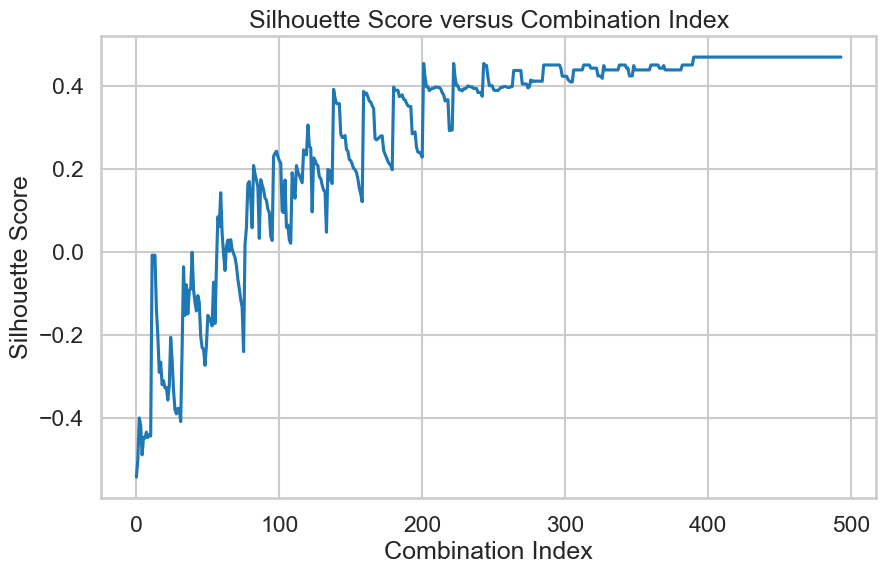

Best parameters: {'EPS': 2.0999999999999996, 'min_samples': 6}
Best silhouette score: 0.4685207355522043


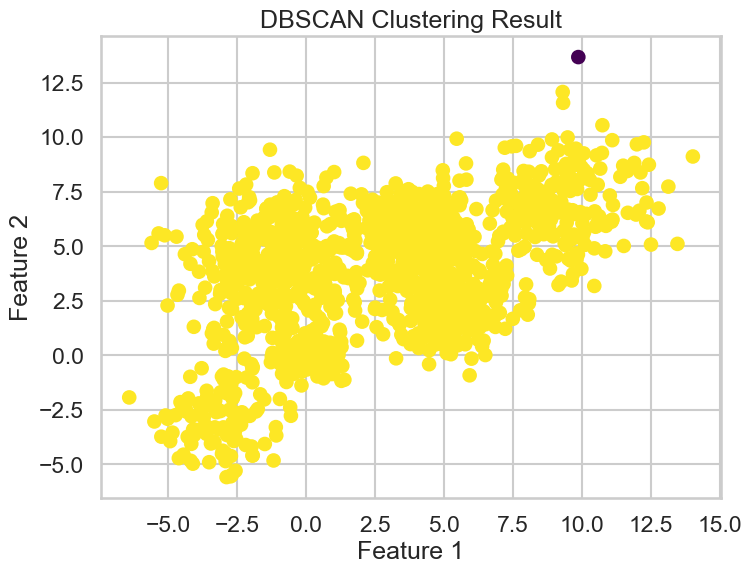

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define the dataset
n_samples = [100, 150, 300, 400, 300, 200]
n_features = 2
cluster_std = [1.3, 0.6, 1.2, 1.7, 0.9, 1.7]
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]

# Generate synthetic data using make_blobs
Multi_blob_Data, _ = make_blobs(n_samples=n_samples, n_features=n_features, cluster_std=cluster_std,
                                 centers=centers, shuffle=False, random_state=42)

# Define the range of EPS and min_samples
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

# Initialize variables to store the best parameters and silhouette score
best_silhouette_score = -1
best_params = {'EPS': None, 'min_samples': None}

# Initialize lists to store silhouette scores
silhouette_scores = []

# Iterate over different combinations of EPS and min_samples
for EPS in EPS_range:
    for min_samples in min_samples_range:
        # Create DBSCAN model with specified parameters
        model = DBSCAN(eps=EPS, min_samples=min_samples)

        # Fit the model and predict labels
        labels = model.fit_predict(Multi_blob_Data)
        
        # Check if there are at least two unique labels
        if len(np.unique(labels)) >= 2:
            # Compute silhouette score
            silhouette_score_value = silhouette_score(Multi_blob_Data, labels)

            # Store the silhouette score and parameters
            silhouette_scores.append(silhouette_score_value)

            # Update the best parameters if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params['EPS'] = EPS
                best_params['min_samples'] = min_samples

# Plot silhouette score versus EPS and min_samples
plt.figure(figsize=(10, 6))
plt.plot(silhouette_scores)
plt.xlabel('Combination Index')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score versus Combination Index')
plt.show()

print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)

# Plot resulting clusters for the best combination of EPS and min_samples
best_model = DBSCAN(eps=best_params['EPS'], min_samples=best_params['min_samples'])
best_labels = best_model.fit_predict(Multi_blob_Data)

plt.figure(figsize=(8, 6))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=best_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

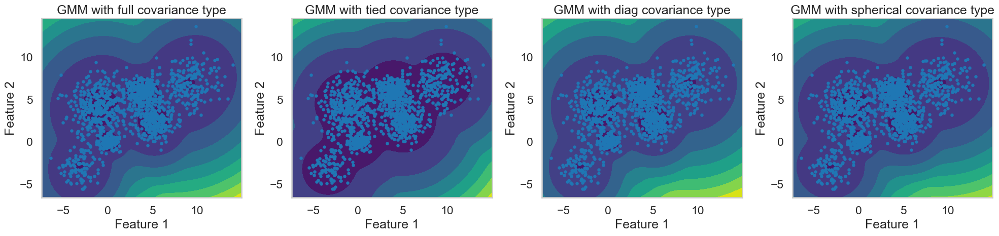

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture

# Generate synthetic data
n_samples = [100, 150, 300, 400, 300, 200]
n_features = 2
cluster_std = [1.3, 0.6, 1.2, 1.7, 0.9, 1.7]
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]

Multi_blob_Data, y = make_blobs(n_samples=n_samples, n_features=n_features, cluster_std=cluster_std,
                                centers=centers, shuffle=False, random_state=42)

# Define covariance types to try
covariance_types = ['full', 'tied', 'diag', 'spherical']

plt.figure(figsize=(len(covariance_types) * 5, 5))

for i, cov_type in enumerate(covariance_types, 1):
    # Fit GMM model with current covariance type
    gmm = GaussianMixture(n_components=len(centers), covariance_type=cov_type, random_state=42)
    gmm.fit(Multi_blob_Data)

    # Generate grid for contour plot
    x_min, x_max = Multi_blob_Data[:, 0].min() - 1, Multi_blob_Data[:, 0].max() + 1
    y_min, y_max = Multi_blob_Data[:, 1].min() - 1, Multi_blob_Data[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot contour with a different colormap
    plt.subplot(1, len(covariance_types), i)
    plt.contourf(xx, yy, Z, cmap=plt.cm.viridis)  # Changed the colormap to viridis

    # Plot data points
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], s=10)

    plt.title(f'GMM with {cov_type} covariance type')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()


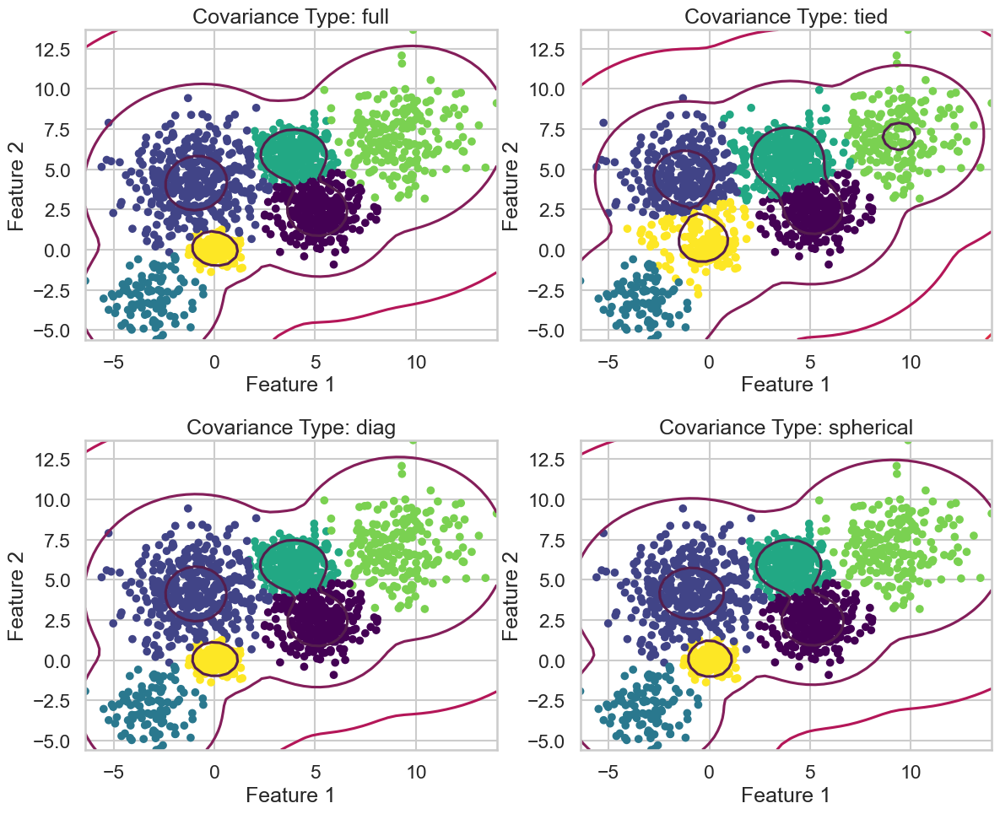

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from matplotlib.colors import LogNorm
from sklearn.datasets import make_blobs
import seaborn as sns

# Define the synthetic dataset
n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)

# Define covariance types to try
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()

# Initialize and fit GMM models with different covariance types
for i, cov_type in enumerate(covariance_types):
    # Initialize GMM model
    gmm = GaussianMixture(n_components=6, covariance_type=cov_type, random_state=42)

    # Fit the model
    gmm.fit(Multi_blob_Data)

    # Plot contour plot for the resulting distribution
    x = np.linspace(Multi_blob_Data[:, 0].min(), Multi_blob_Data[:, 0].max())
    y = np.linspace(Multi_blob_Data[:, 1].min(), Multi_blob_Data[:, 1].max())
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)

    axs[i].contour(X_mesh, Y_mesh, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
    axs[i].scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], marker='o', c=gmm.predict(Multi_blob_Data), s=30, cmap='viridis')
    axs[i].set_title(f'Covariance Type: {cov_type}')
    axs[i].set_xlabel('Feature 1')
    axs[i].set_ylabel('Feature 2')

plt.tight_layout()
plt.show()


## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [60]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

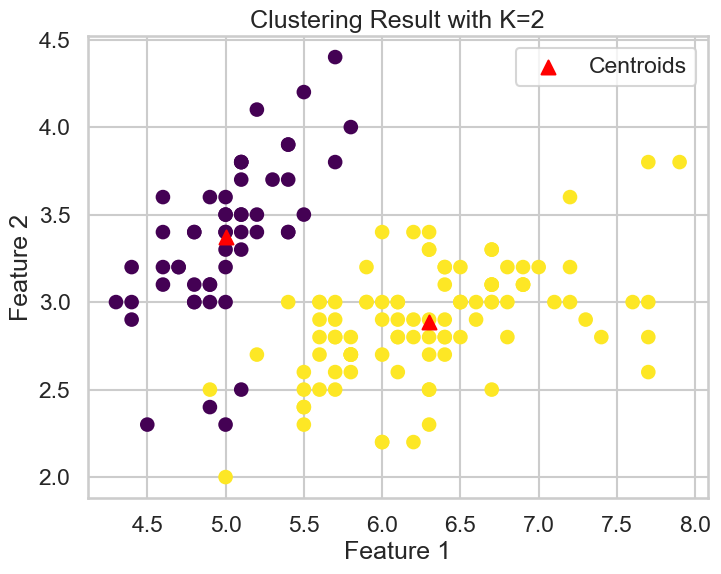

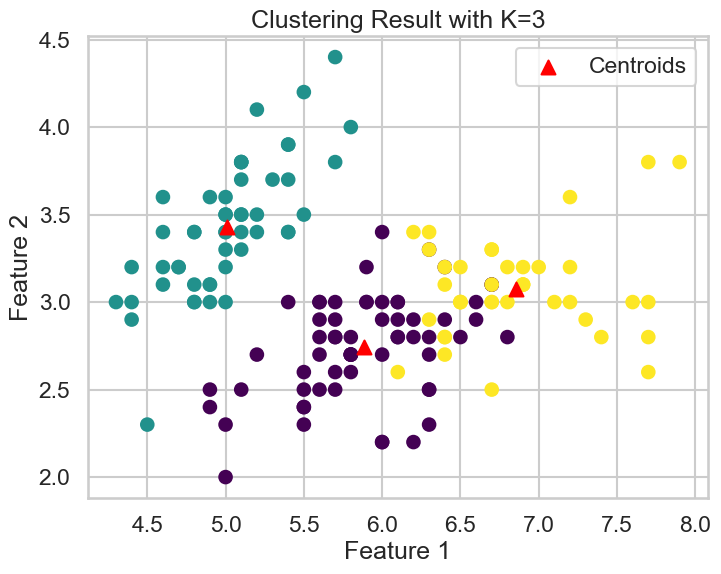

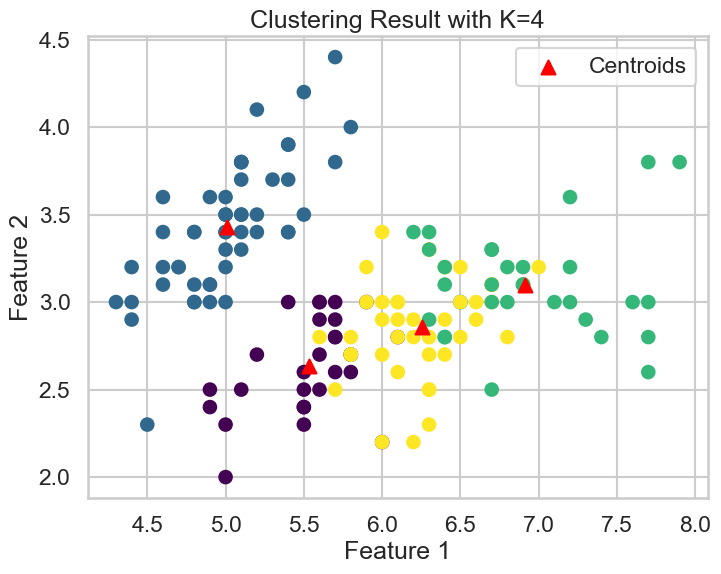

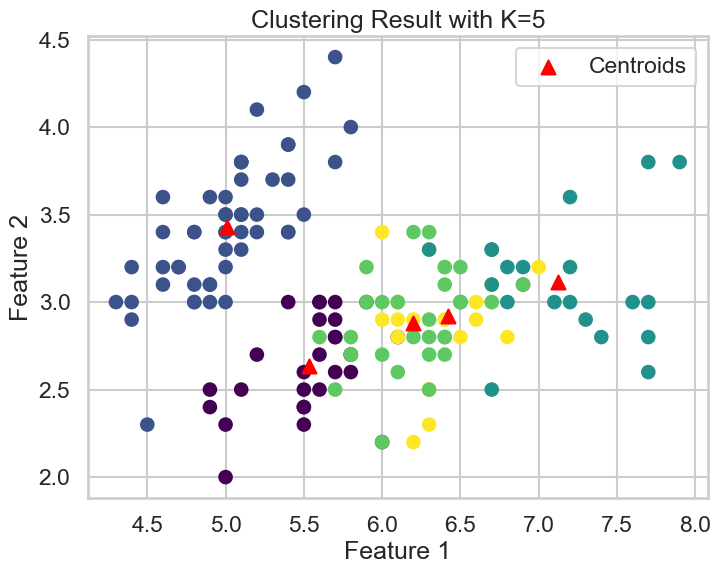

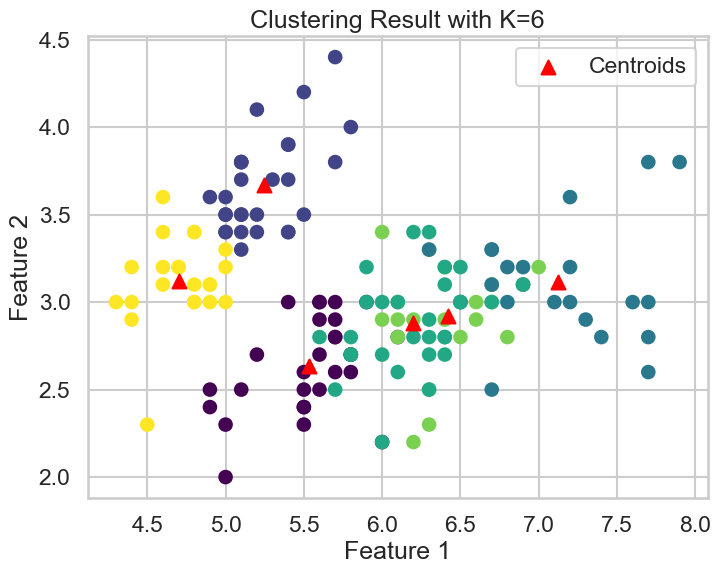

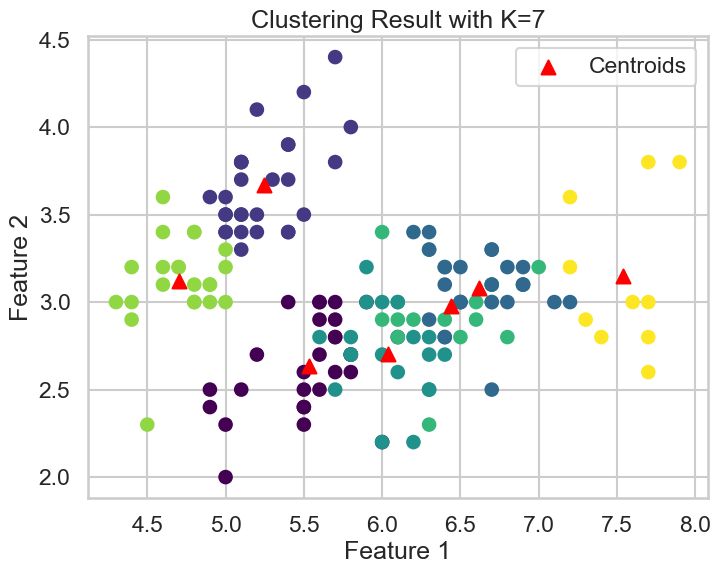

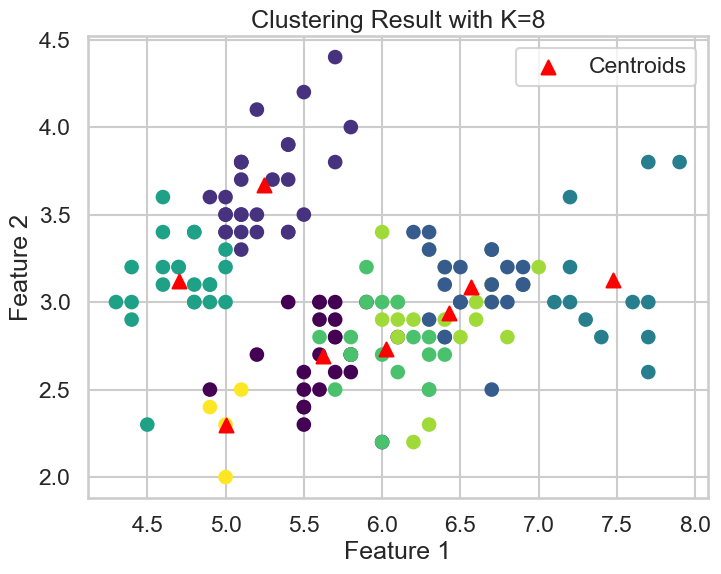

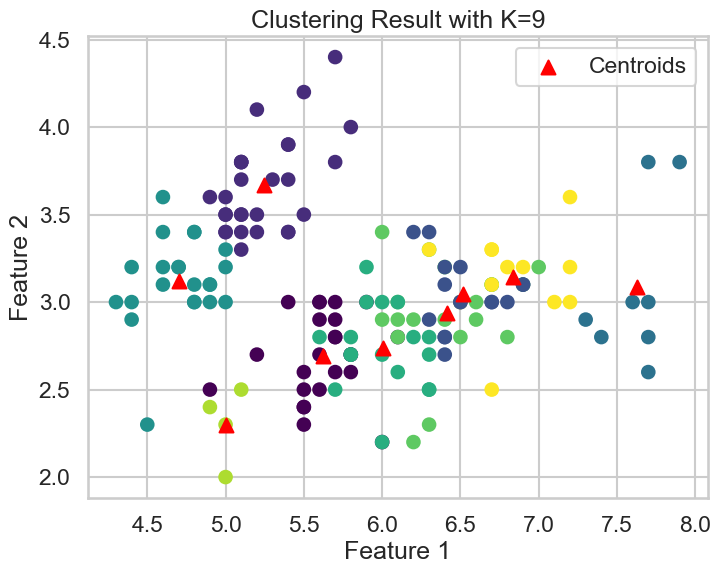

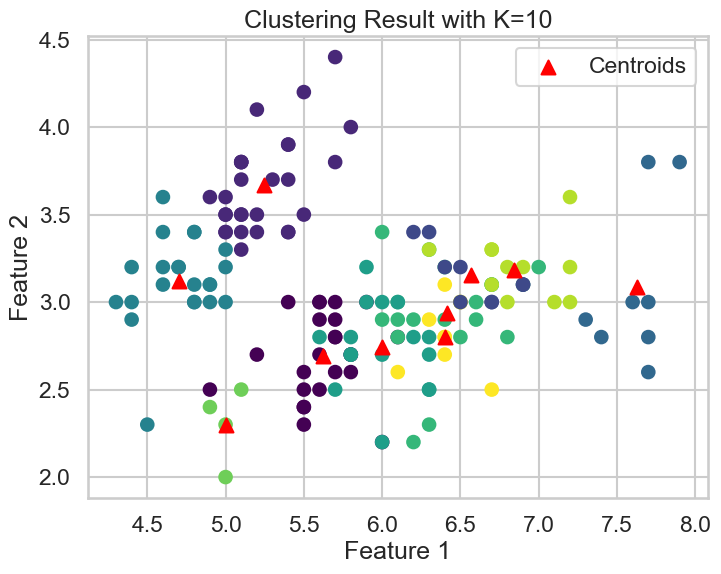

Best value of K based on silhouette score: 2
Silhouette score for the best K: 0.6810461692117462


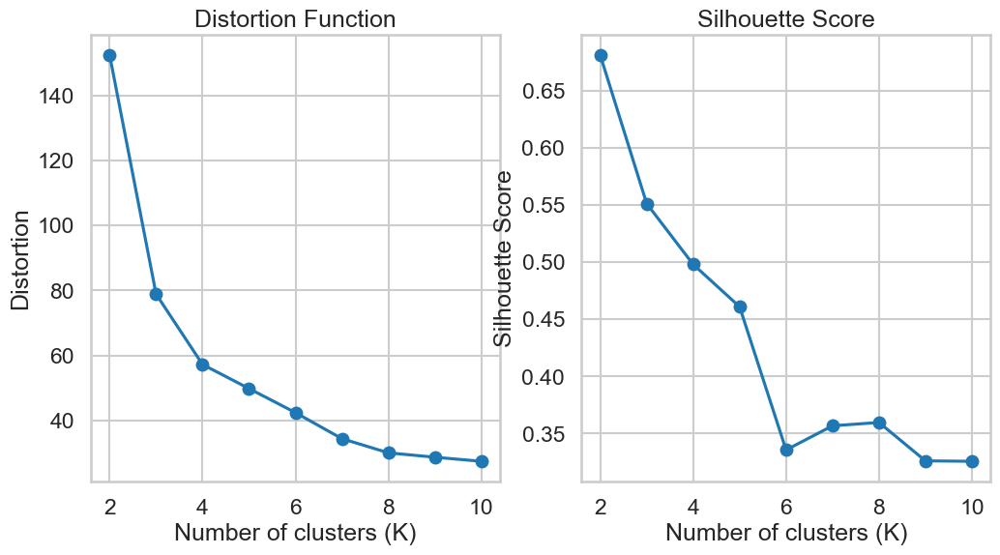

In [66]:
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data  # Features

# Define the range of K values to try
k_values = range(2, 11)

# Initialize lists to store silhouette scores and distortions for each K
silhouette_scores = []
distortions = []

# Iterate over each value of K
for k in k_values:
    # Initialize and fit KMeans clustering model
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    
    # Compute silhouette score
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))
    
    # Compute distortion (inertia)
    distortions.append(kmeans.inertia_)
    
    # Plot the clustering outcome for each value of K
    plt.figure(figsize=(8, 6))
    plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_, cmap='viridis')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='^', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Result with K={k}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

# Plot distortion function versus K
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(k_values, distortions, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Distortion')
plt.title('Distortion Function')

# Plot silhouette score versus K
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

# Choose the best value of K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print("Best value of K based on silhouette score:", best_k)

# Store the silhouette score for the best K
best_silhouette_score = max(silhouette_scores)
print("Silhouette score for the best K:", best_silhouette_score)

plt.show()


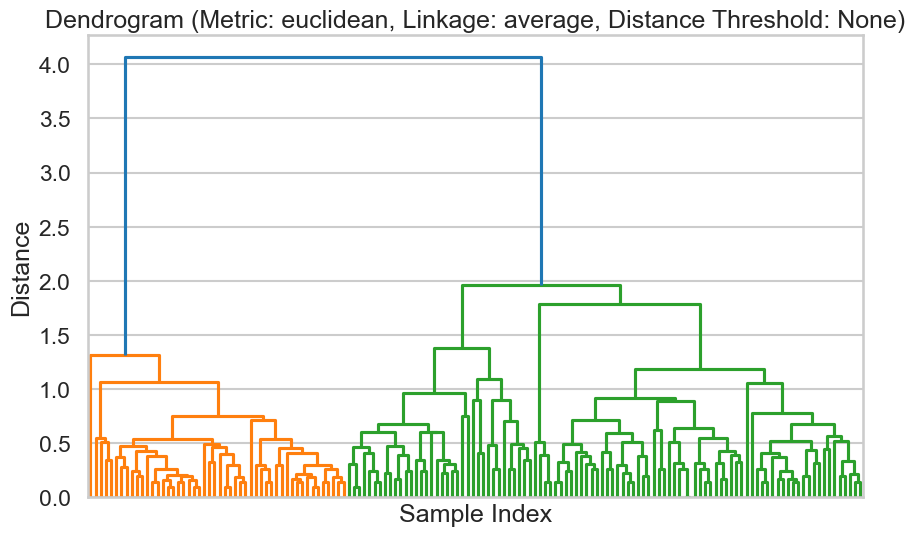

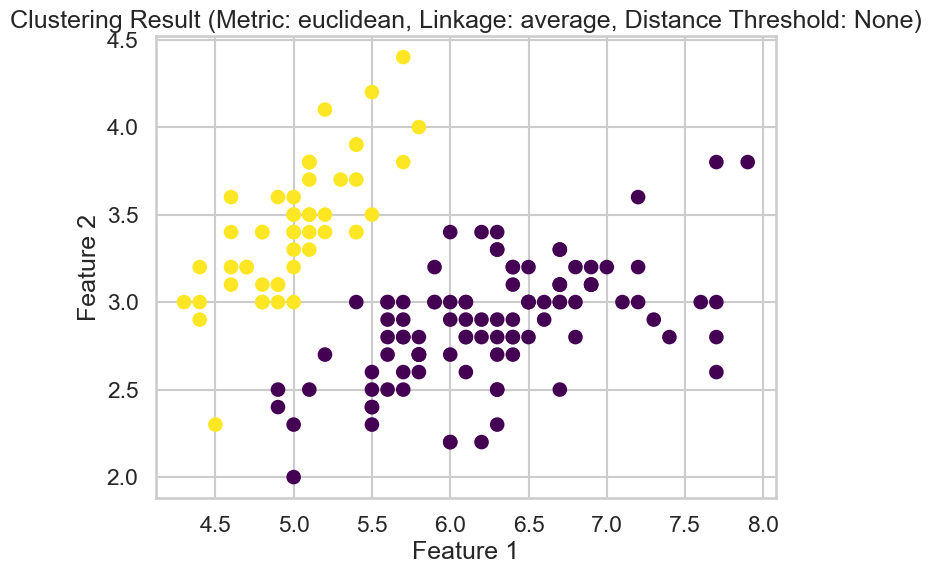

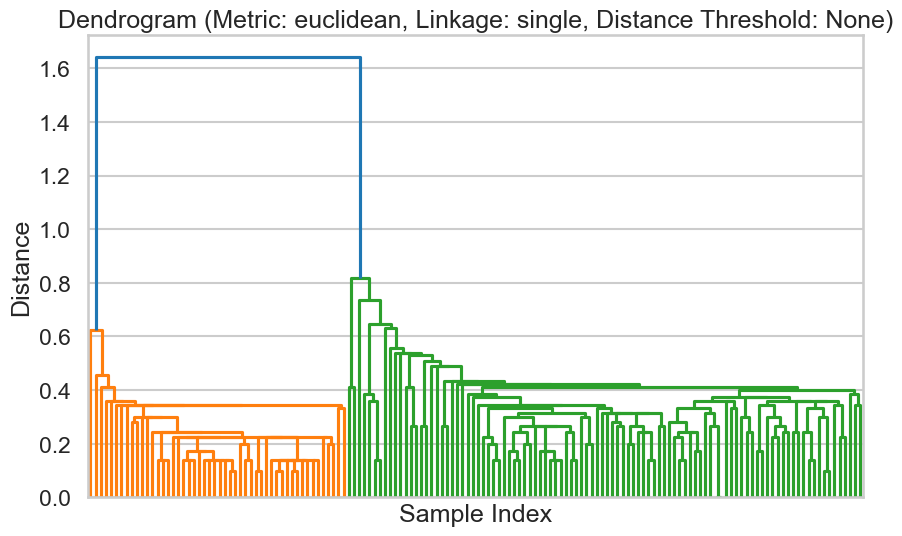

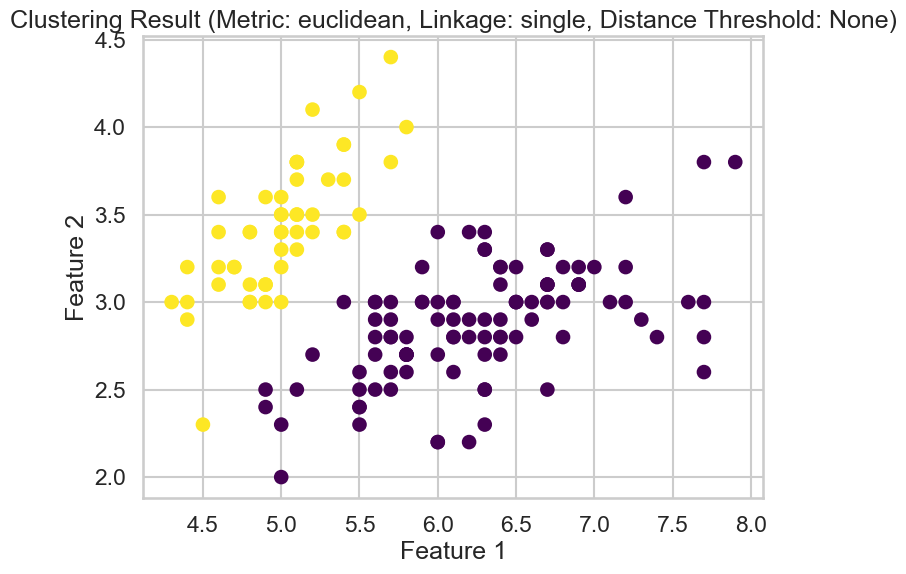

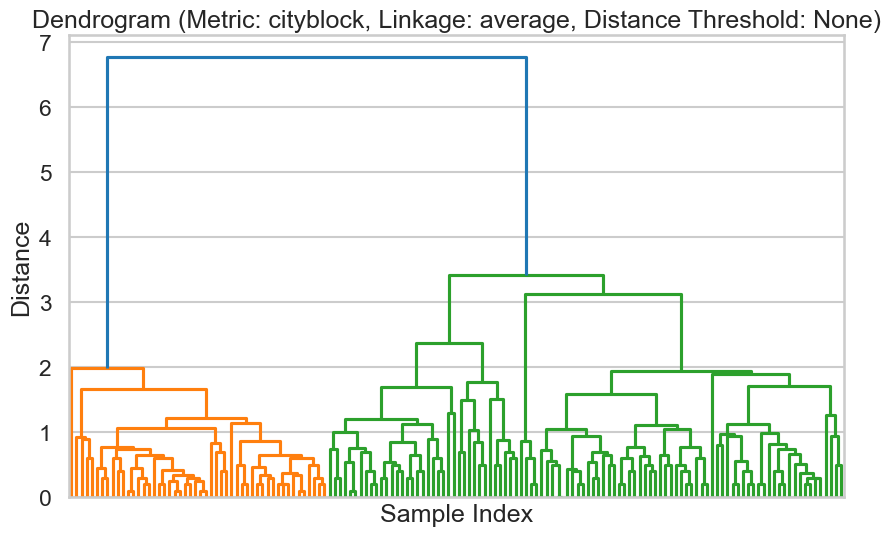

...

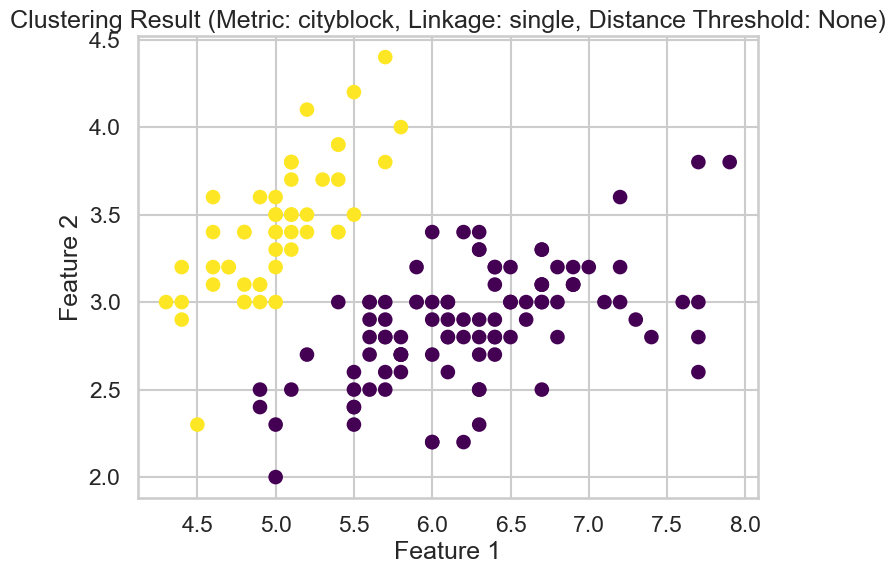

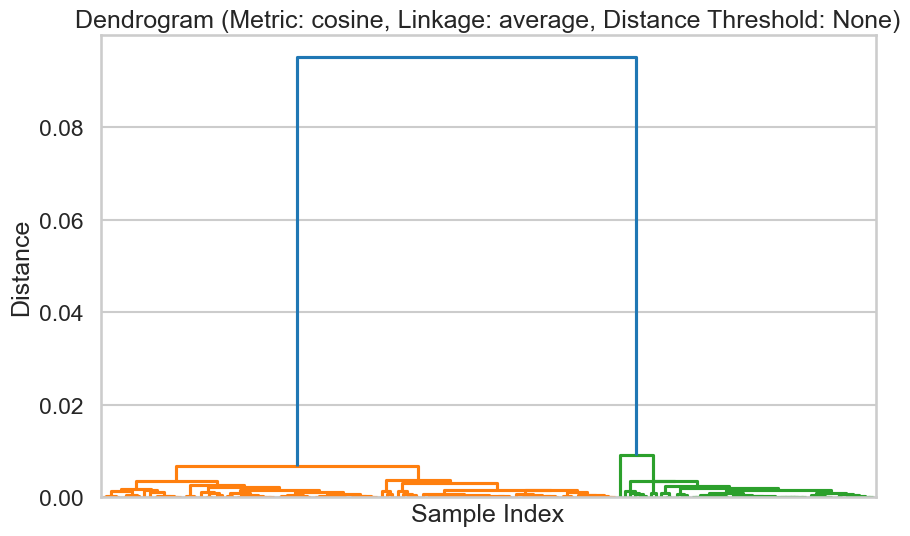

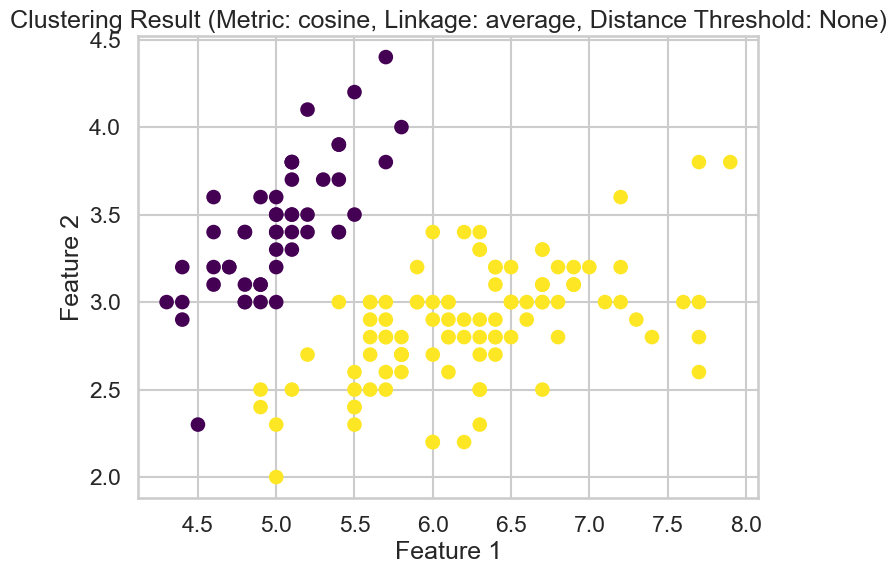

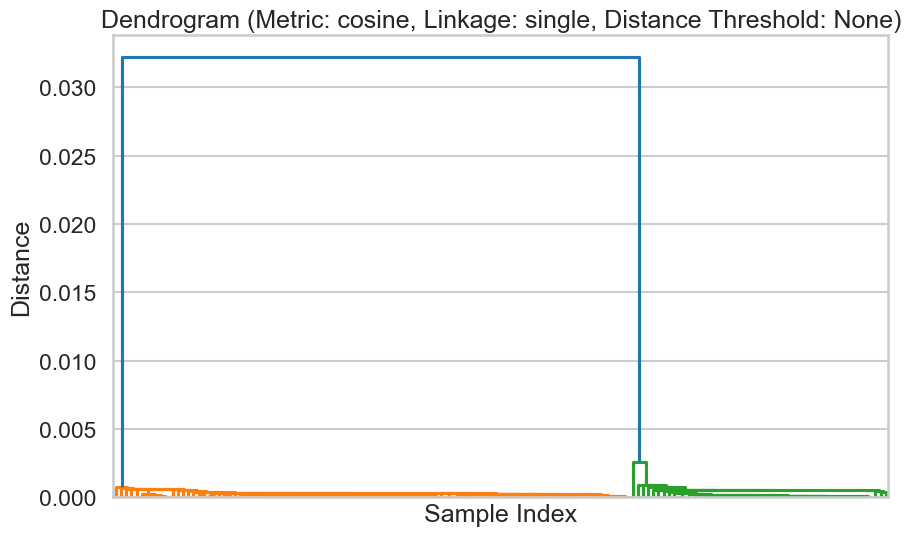

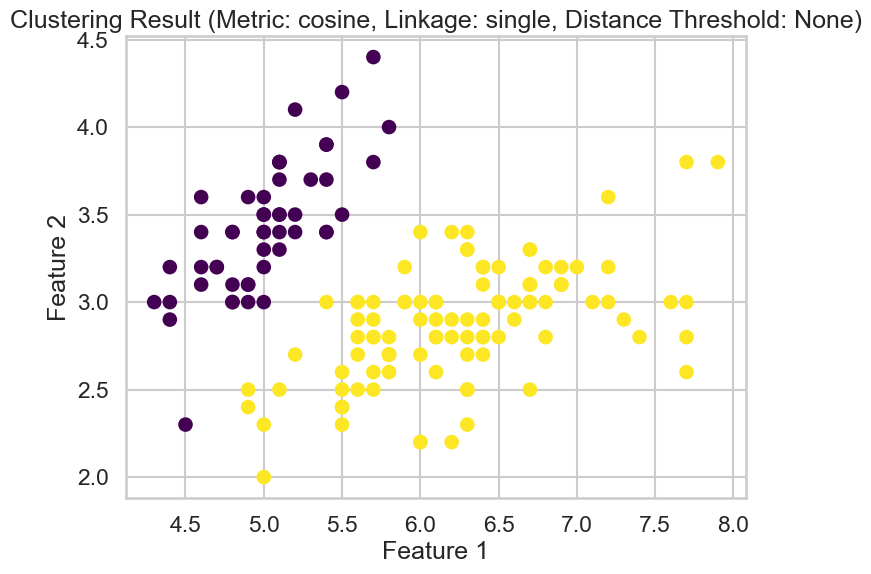

Best parameters: {'Metric': 'euclidean', 'Linkage': 'average', 'Distance Threshold': None}
Best silhouette score: 0.6867350732769777


In [47]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Initialize best silhouette score and parameters
best_silhouette_score = -1
best_params = {}

# Define parameters to try
metrics = ['euclidean', 'cityblock', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [None, 5]

# Iterate over different combinations of parameters
for metric in metrics:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            # Create AgglomerativeClustering model with specified parameters
            if distance_threshold is None:
                model = AgglomerativeClustering(linkage=linkage_method, metric=metric)
            else:
                model = AgglomerativeClustering(n_clusters=None, linkage=linkage_method, distance_threshold=distance_threshold, metric=metric)

            # Fit the model and predict labels
            labels = model.fit_predict(X)

            # Ensure there are more than 1 unique label
            if len(set(labels)) < 2:
                continue

            # Calculate silhouette score
            silhouette_score_value = silhouette_score(X, labels)

            # Compute linkage matrix
            Z = linkage(X, method=linkage_method, metric=metric)

            # Plot dendrogram
            plt.figure(figsize=(10, 6))
            plt.title(f'Dendrogram (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            dendrogram(Z, no_labels=True)
            plt.xlabel('Sample Index')
            plt.ylabel('Distance')
            plt.show()

            # Display resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
            plt.title(f'Clustering Result (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.show()

            # Update best parameters and silhouette score if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params = {'Metric': metric, 'Linkage': linkage_method, 'Distance Threshold': distance_threshold}

# Print the best parameters and silhouette score
print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)


## There is a problem with this since it outputs 2 clusters when changing multiple parameters


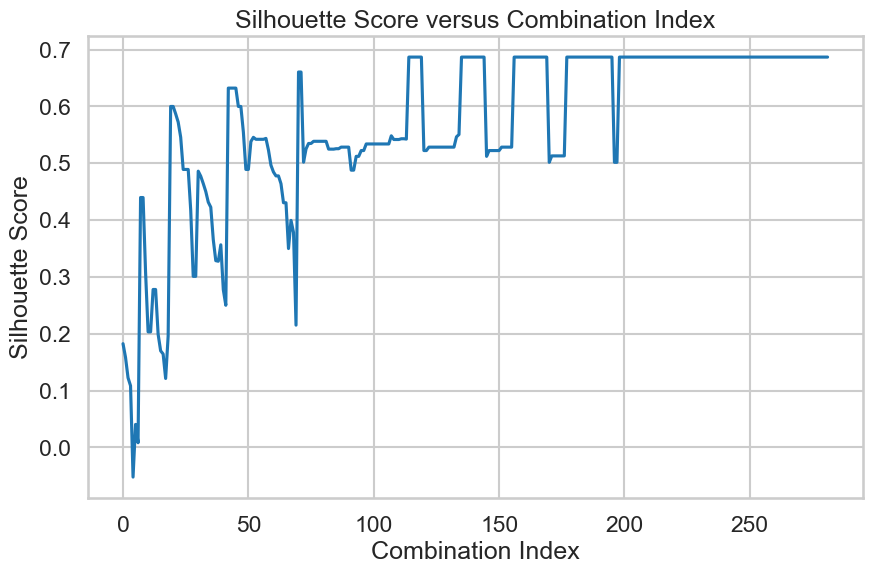

Best parameters: {'EPS': 0.8999999999999999, 'min_samples': 5}
Best silhouette score: 0.6867350732769777


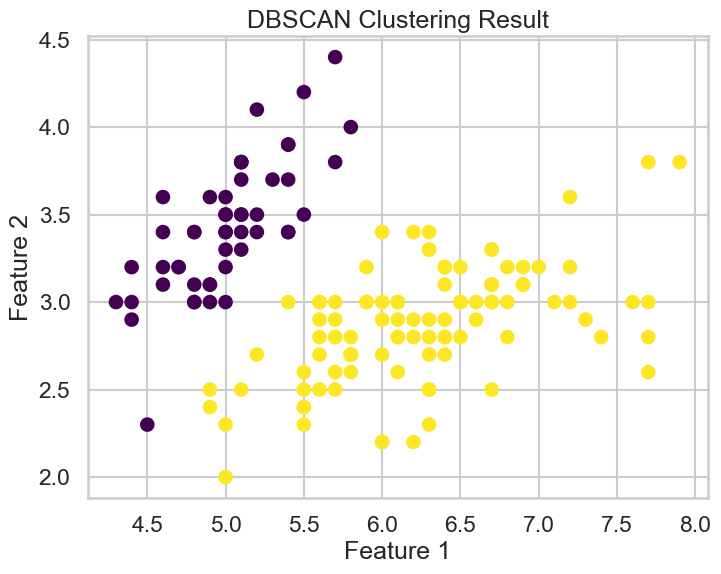

In [70]:
#DBScn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Define the range of EPS and min_samples
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

# Initialize variables to store the best parameters and silhouette score
best_silhouette_score = -1
best_params = {'EPS': None, 'min_samples': None}

# Initialize lists to store silhouette scores
silhouette_scores = []

# Iterate over different combinations of EPS and min_samples
for EPS in EPS_range:
    for min_samples in min_samples_range:
        # Create DBSCAN model with specified parameters
        model = DBSCAN(eps=EPS, min_samples=min_samples)

        # Fit the model and predict labels
        labels = model.fit_predict(X)
        
        # Check if there are at least two unique labels
        if len(np.unique(labels)) >= 2:
            # Compute silhouette score
            silhouette_score_value = silhouette_score(X, labels)

            # Store the silhouette score and parameters
            silhouette_scores.append(silhouette_score_value)

            # Update the best parameters if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params['EPS'] = EPS
                best_params['min_samples'] = min_samples

# Plot silhouette score versus EPS and min_samples
plt.figure(figsize=(10, 6))
plt.plot(silhouette_scores)
plt.xlabel('Combination Index')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score versus Combination Index')
plt.show()

print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)

# Plot resulting clusters for the best combination of EPS and min_samples
best_model = DBSCAN(eps=best_params['EPS'], min_samples=best_params['min_samples'])
best_labels = best_model.fit_predict(X)

plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()





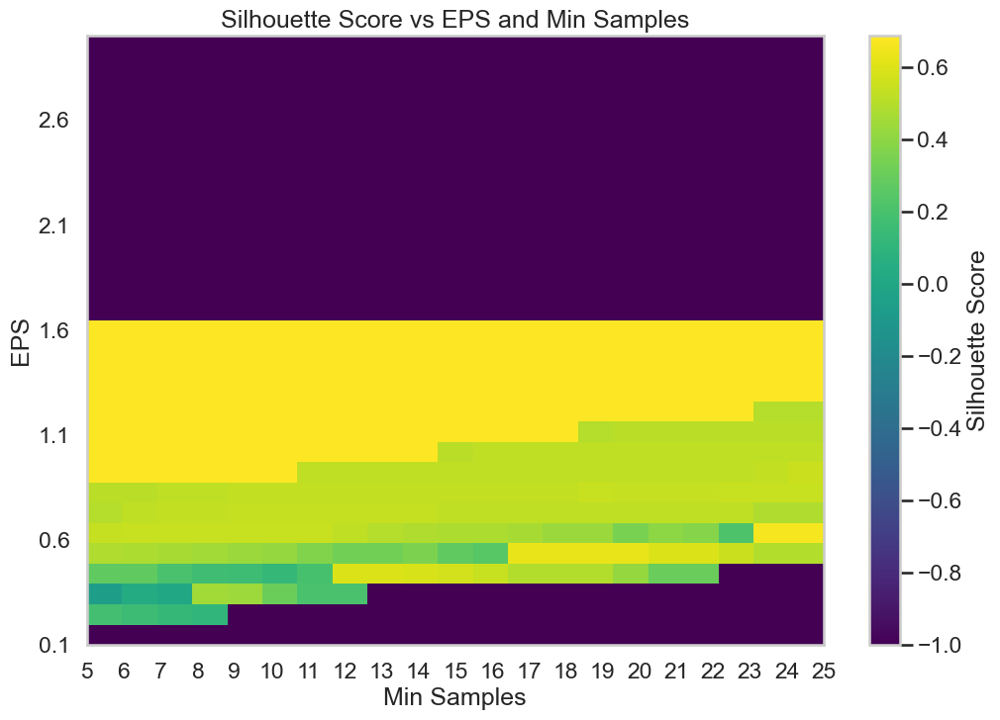

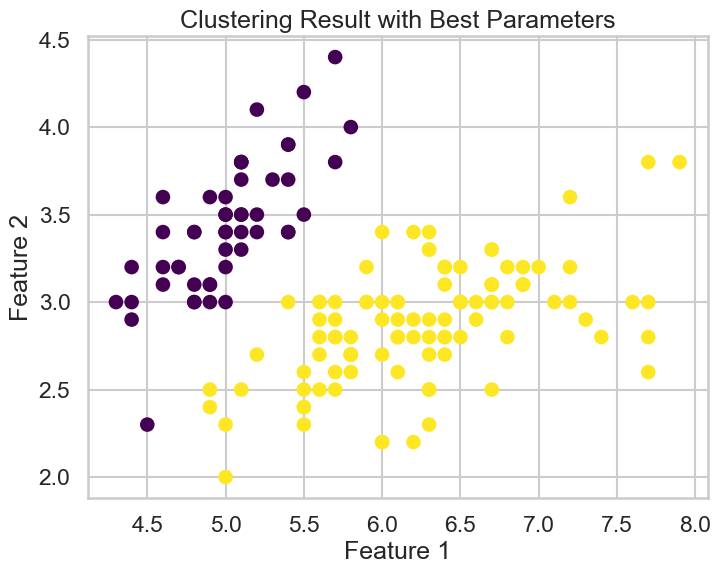

Best parameters:
EPS: 0.9
Min Samples: 5
Best silhouette score: 0.6867350732769777


In [48]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_iris
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Define range of values for EPS and min_samples
eps_range = np.arange(0.1, 3.1, 0.1)
min_samples_range = range(5, 26)

# Initialize array to store silhouette scores
silhouette_scores = np.zeros((len(eps_range), len(min_samples_range)))

# Initialize variables to store best parameters and silhouette score
best_eps = None
best_min_samples = None
best_silhouette_score = -1

# Iterate over different combinations of EPS and min_samples
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        # Create DBSCAN model with specified parameters
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        # Fit the model and predict labels
        labels = dbscan.fit_predict(X)

        # Check if only one label is present
        if len(np.unique(labels)) == 1:
            silhouette_scores[i, j] = -1  # Set silhouette score to -1 for invalid clusters
            continue

        # Calculate silhouette score
        silhouette_score_value = silhouette_score(X, labels)

        # Store silhouette score in array
        silhouette_scores[i, j] = silhouette_score_value

        # Update best parameters and silhouette score
        if silhouette_score_value > best_silhouette_score:
            best_eps = eps
            best_min_samples = min_samples
            best_silhouette_score = silhouette_score_value

# Plot heatmap of silhouette scores
plt.figure(figsize=(12, 8))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', aspect='auto', extent=[5, 25, 0.1, 3.0])
plt.colorbar(label='Silhouette Score')
plt.xlabel('Min Samples')
plt.ylabel('EPS')
plt.title('Silhouette Score vs EPS and Min Samples')
plt.xticks(range(5, 26))
plt.yticks(np.arange(0.1, 3.1, 0.5))
plt.grid(False)
plt.show()

# Plot clustered data using the best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(X)

plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='viridis')
plt.title('Clustering Result with Best Parameters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

print("Best parameters:")
print("EPS:", best_eps)
print("Min Samples:", best_min_samples)
print("Best silhouette score:", best_silhouette_score)

## this code shows the silhouette score vs min_num_ of smaples and EPs as heat map

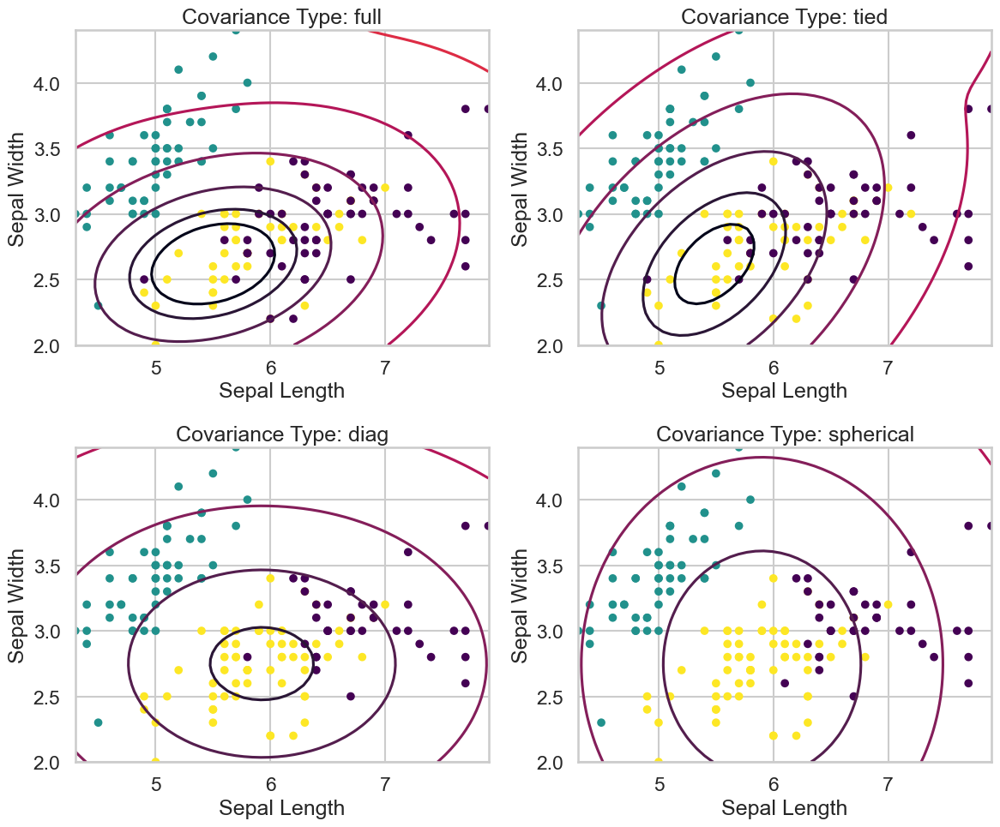

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.mixture import GaussianMixture
from matplotlib.colors import LogNorm

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Define covariance types to try
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()

# Initialize and fit GMM models with different covariance types
for i, cov_type in enumerate(covariance_types):
    # Initialize GMM model
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)

    # Fit the model
    gmm.fit(X)

    # Plot contour plot for the resulting distribution
    x = np.linspace(iris_data.data[:, 0].min(), iris_data.data[:, 0].max())
    y = np.linspace(iris_data.data[:, 1].min(), iris_data.data[:, 1].max())
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel(),
                   np.full_like(X_mesh.ravel(), iris_data.data[:, 2].mean()),
                   np.full_like(X_mesh.ravel(), iris_data.data[:, 3].mean())]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)

    axs[i].contour(X_mesh, Y_mesh, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
    axs[i].scatter(X[:, 0], X[:, 1], marker='o', c=gmm.predict(X), s=30, cmap='viridis')
    axs[i].set_title(f'Covariance Type: {cov_type}')
    axs[i].set_xlabel('Sepal Length')
    axs[i].set_ylabel('Sepal Width')

plt.tight_layout()
plt.show()


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

In [76]:
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)


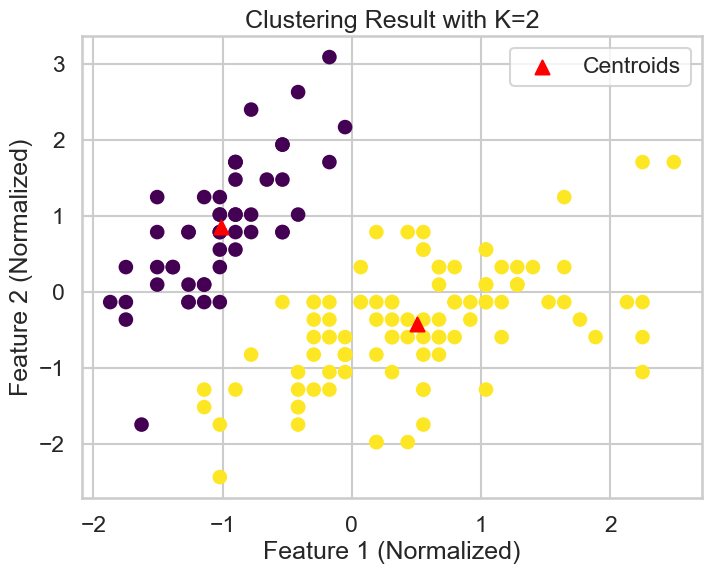

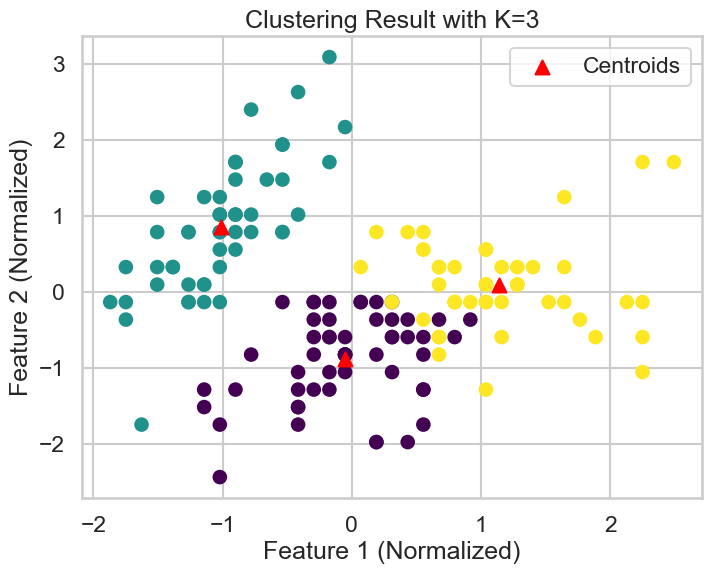

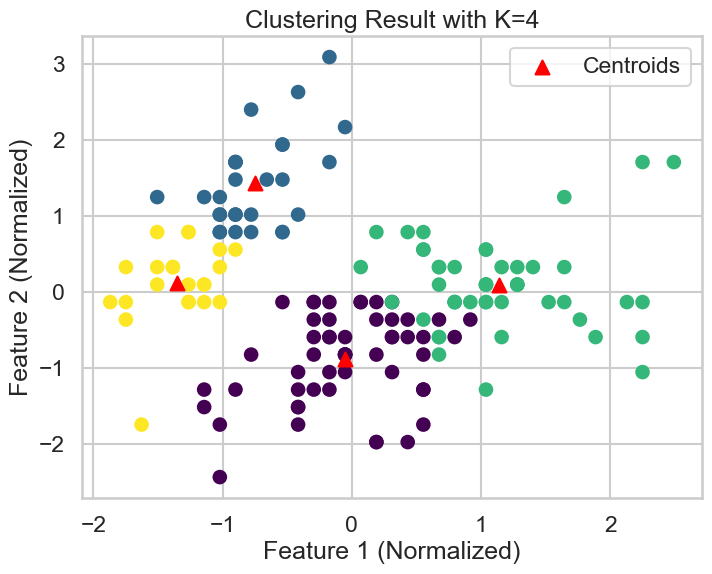

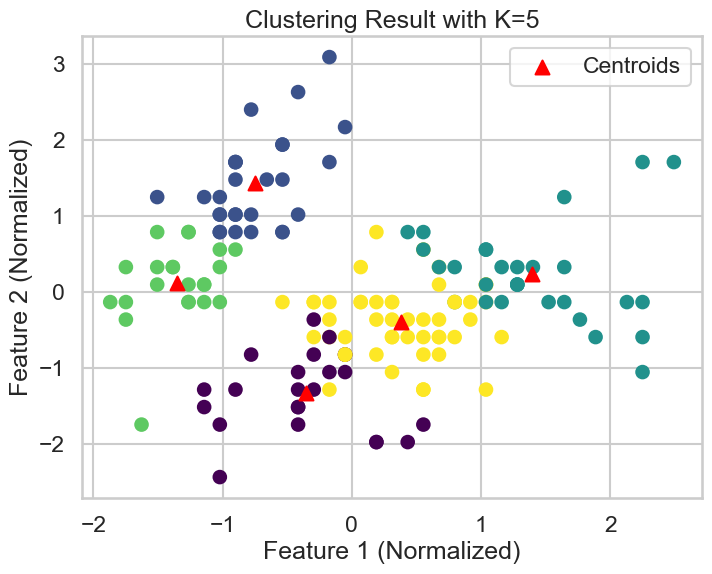

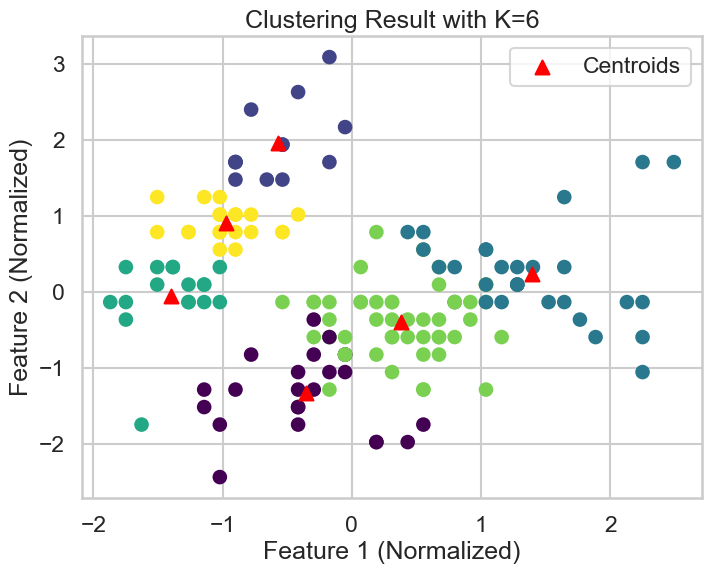

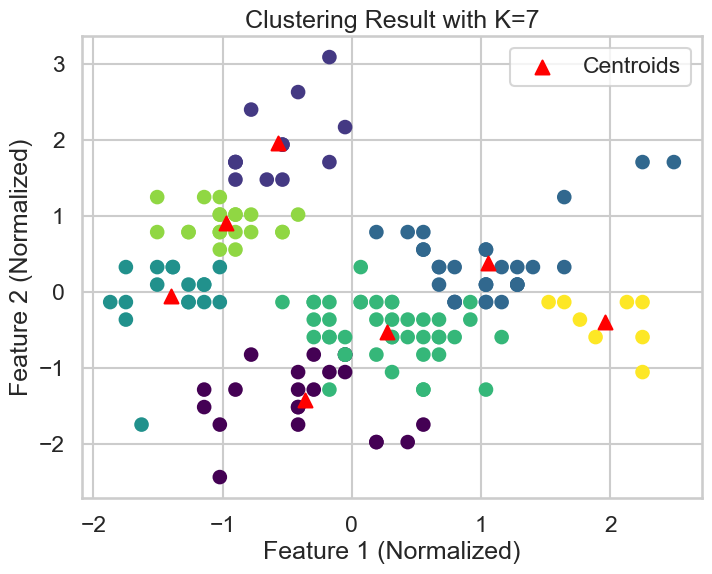

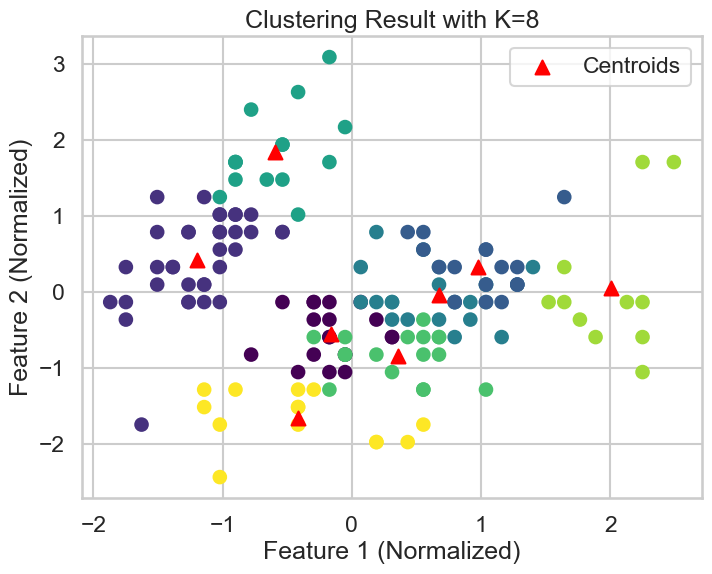

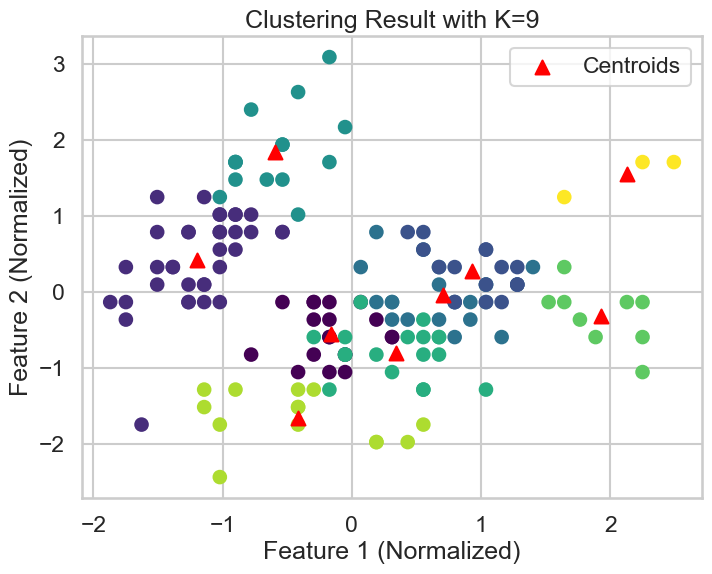

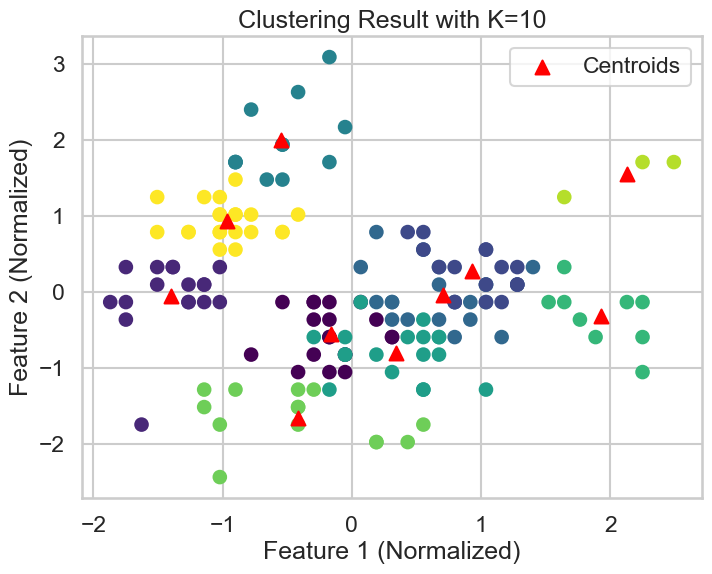

Best value of K based on silhouette score: 2
Silhouette score for the best K: 0.5817500491982808


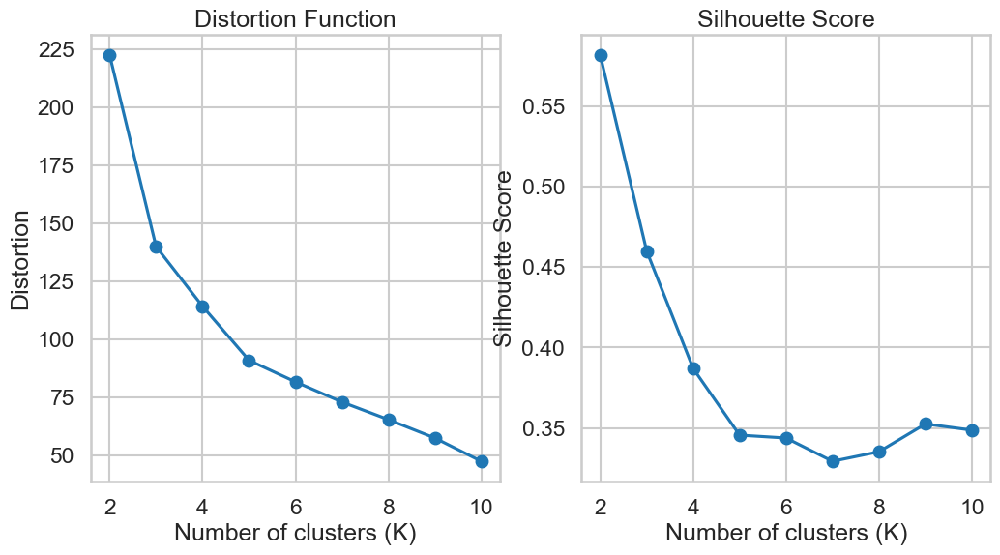

In [75]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Define the range of K values to try
k_values = range(2, 11)

# Initialize lists to store distortion and silhouette scores
distortions = []
silhouette_scores = []

# Iterate over each value of K
for k in k_values:
    # Initialize and fit KMeans clustering model
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_normalized)
    
    # Compute distortion
    distortions.append(kmeans.inertia_)
    
    # Compute silhouette score
    silhouette_scores.append(silhouette_score(X_normalized, kmeans.labels_))
    
    # Display the outcome for each value of K
    plt.figure(figsize=(8, 6))
    plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=kmeans.labels_, cmap='viridis')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='^', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Result with K={k}')
    plt.xlabel('Feature 1 (Normalized)')
    plt.ylabel('Feature 2 (Normalized)')
    plt.legend()
    plt.show()

# Plot distortion function versus K
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(k_values, distortions, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Distortion')
plt.title('Distortion Function')

# Plot silhouette score versus K
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

# Choose the best value of K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print("Best value of K based on silhouette score:", best_k)

# Store the silhouette score for the best K
best_silhouette_score = max(silhouette_scores)
print("Silhouette score for the best K:", best_silhouette_score)

plt.show()


In [62]:
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Define parameters to try
linkages = ['average', 'single']
distance_thresholds = [10, 20]

# Iterate over different combinations of parameters
for linkage_method in linkages:
    for distance_threshold in distance_thresholds:
        # Create AgglomerativeClustering model with specified parameters
        if distance_threshold is not None:
            model = AgglomerativeClustering(linkage=linkage_method, distance_threshold=distance_threshold)
        else:
            model = AgglomerativeClustering(linkage=linkage_method)  # Adjusted number of clusters to 3

        # Fit the model and predict labels
        labels = model.fit_predict(X_normalized)

        # Check if there are at least two unique labels
        unique_labels = np.unique(labels)
        if len(unique_labels) >= 2:
            # Compute linkage matrix
            Z = linkage(X_normalized, method=linkage_method)

            # Plot dendrogram
            plt.figure(figsize=(10, 6))
            plt.title(f'Dendrogram (Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            dendrogram(Z, no_labels=True)
            plt.xlabel('Sample Index')
            plt.ylabel('Distance')
            plt.show()

            # Display resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=labels, cmap='viridis')
            plt.title(f'Clustering Result (Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.show()


ValueError: Exactly one of n_clusters and distance_threshold has to be set, and the other needs to be None.

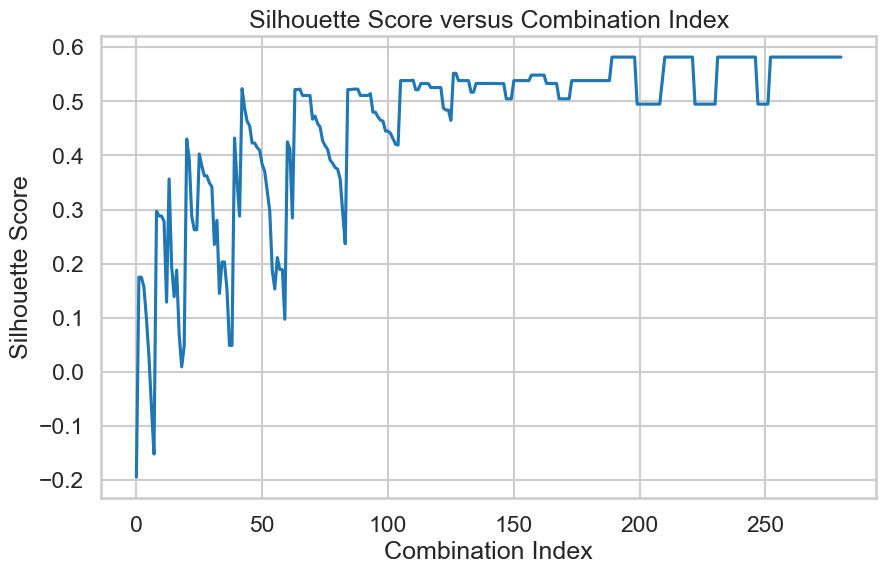

Best parameters: {'EPS': 1.4, 'min_samples': 5}
Best silhouette score: 0.5817500491982808


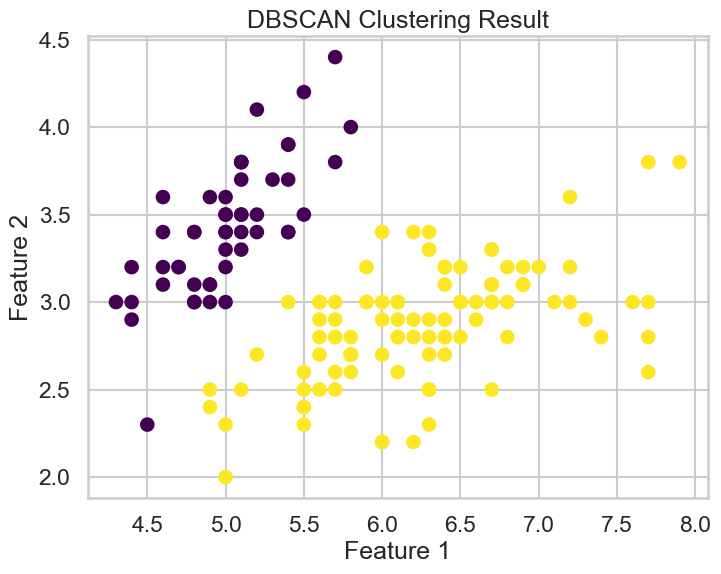

In [57]:
#DBSCAN

from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Define parameters to try
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

# Initialize variables to store the best parameters and silhouette score
best_silhouette_score = -1
best_params = {'EPS': None, 'min_samples': None}

# Initialize lists to store silhouette scores
silhouette_scores = []

# Iterate over different combinations of EPS and min_samples
for EPS in EPS_range:
    for min_samples in min_samples_range:
        # Create DBSCAN model with specified parameters
        model = DBSCAN(eps=EPS, min_samples=min_samples)

        # Fit the model and predict labels
        labels = model.fit_predict(X_normalized)

        # Check if there are at least two unique labels
        unique_labels = np.unique(labels)
        if len(unique_labels) >= 2:
            # Compute silhouette score
            silhouette_score_value = silhouette_score(X_normalized, labels)

            # Store the silhouette score and parameters
            silhouette_scores.append(silhouette_score_value)

            # Update the best parameters if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params['EPS'] = EPS
                best_params['min_samples'] = min_samples

# Plot silhouette score versus EPS and min_samples
plt.figure(figsize=(10, 6))
plt.plot(silhouette_scores)
plt.xlabel('Combination Index')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score versus Combination Index')
plt.show()

print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)

# Plot resulting clusters for the best combination of EPS and min_samples
best_model = DBSCAN(eps=best_params['EPS'], min_samples=best_params['min_samples'])
best_labels = best_model.fit_predict(X_normalized)

plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


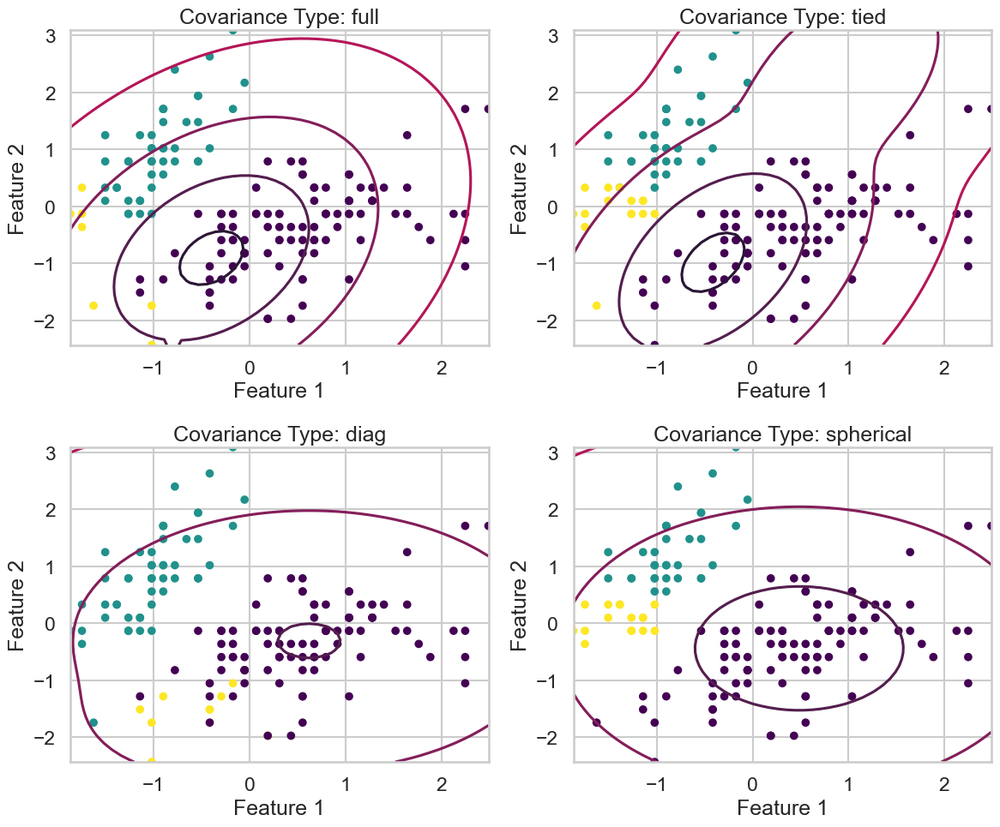

In [84]:
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Load the iris dataset
iris_data = load_iris()
X = iris_data.data

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Define covariance types to try
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()

# Initialize and fit GMM models with different covariance types
for i, cov_type in enumerate(covariance_types):
    # Initialize GMM model
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)

    # Fit the model
    gmm.fit(X_normalized)

    # Plot contour plot for the resulting distribution
    x = np.linspace(X_normalized[:, 0].min(), X_normalized[:, 0].max())
    y = np.linspace(X_normalized[:, 1].min(), X_normalized[:, 1].max())
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel(), 
                   np.full_like(X_mesh.ravel(), X_normalized[:, 2].mean()), 
                   np.full_like(X_mesh.ravel(), X_normalized[:, 3].mean())]).T  # Ensure 4 features
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)

    axs[i].contour(X_mesh, Y_mesh, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
    axs[i].scatter(X_normalized[:, 0], X_normalized[:, 1], marker='o', c=gmm.predict(X_normalized), s=30, cmap='viridis')
    axs[i].set_title(f'Covariance Type: {cov_type}')
    axs[i].set_xlabel('Feature 1')
    axs[i].set_ylabel('Feature 2')

plt.tight_layout()
plt.show() 

#No need to do the GMM fro the normalised data since gmm normalises data.


## Customer dataset
Repeat all the above on the customer data set 

In [58]:
#Data set
import pandas as pd


df = pd.read_csv(r'C:\Users\jessi\Customer data.csv')
column_to_drop = 'ID'  # Replace 'column_name' with the name of the column you want to drop
df.drop(column_to_drop, axis=1, inplace=True)

print(df.head())


   Sex  Marital status  Age  Education  Income  Occupation  Settlement size
0    0               0   67          2  124670           1                2
1    1               1   22          1  150773           1                2
2    0               0   49          1   89210           0                0
3    0               0   45          1  171565           1                1
4    0               0   53          1  149031           1                1


Best K: 2
Silhouette Score for Best K: 0.5834469001696239


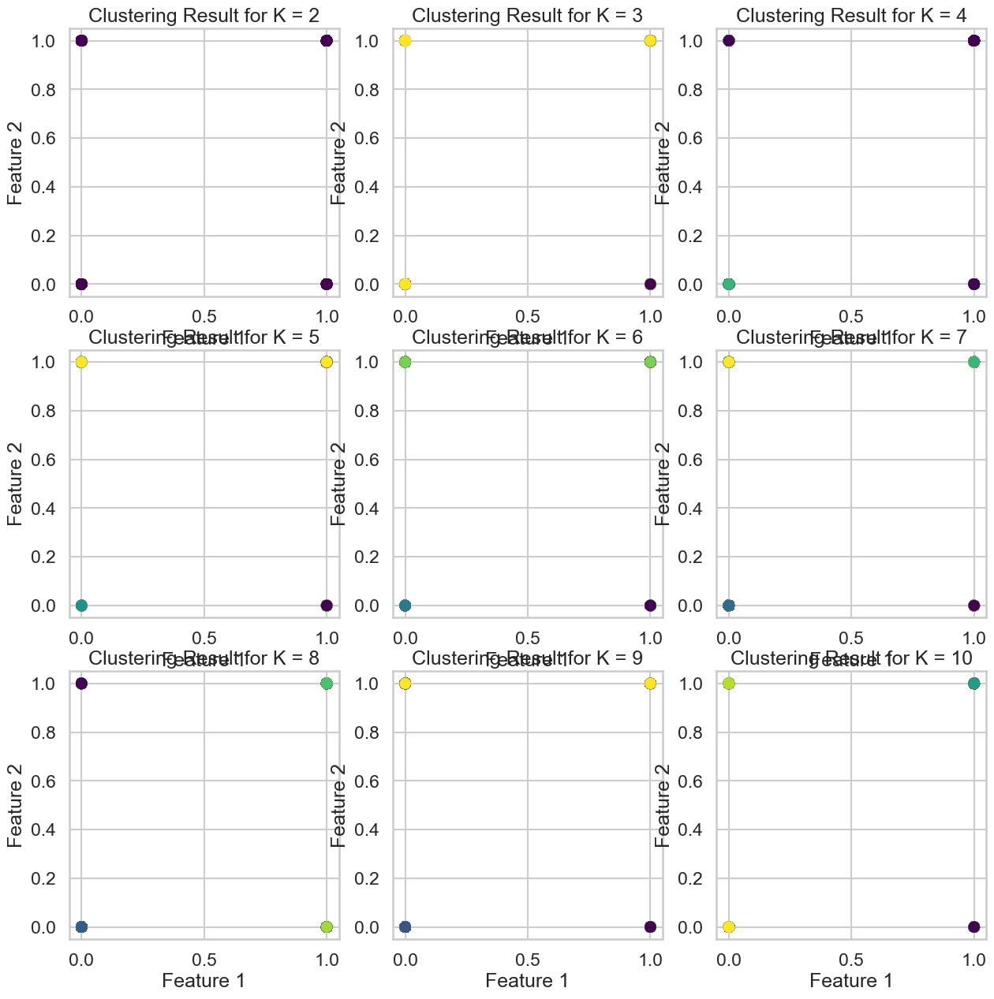

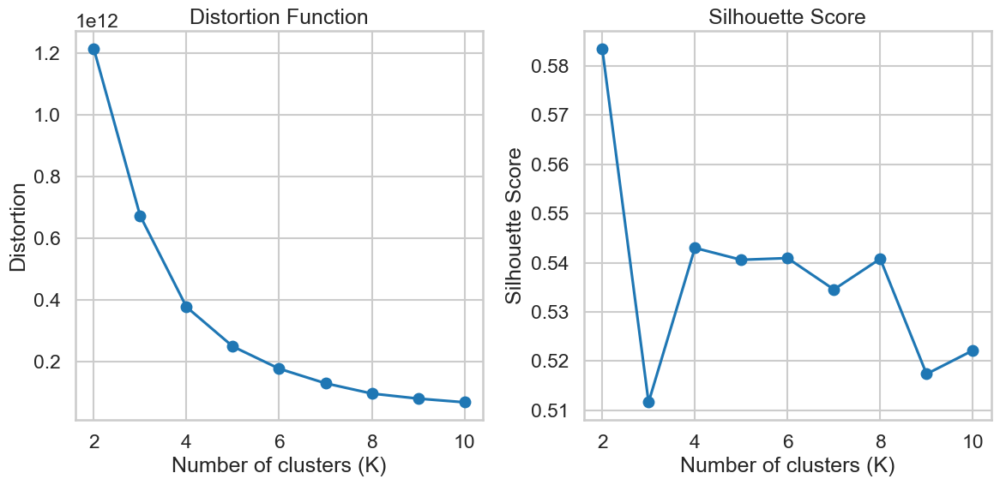

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Extract features from the DataFrame
X = df.values

# Define a range of K values to try
k_values = range(2, 11)

# Initialize lists to store distortion and silhouette scores
distortions = []
silhouette_scores = []

# Initialize subplots
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

# Iterate over different values of K
for i, k in enumerate(k_values):
    # Create KMeans model with specified number of clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Fit the model to the data
    kmeans.fit(X)
    
    # Predict cluster labels
    labels = kmeans.labels_
    
    # Calculate distortion (inertia)
    distortion = kmeans.inertia_
    distortions.append(distortion)
    
    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)
    
    # Plot clustering result for current value of K
    ax = axs[i // 3, i % 3]
    ax.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
    ax.set_title(f'Clustering Result for K = {k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

# Plot distortion function versus K
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(k_values, distortions, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Distortion')
plt.title('Distortion Function')

# Plot silhouette score versus K
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')

# Find the best K based on silhouette score
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]
best_silhouette_score = max(silhouette_scores)
print(f"Best K: {best_k}")
print(f"Silhouette Score for Best K: {best_silhouette_score}")

plt.tight_layout()
plt.show()


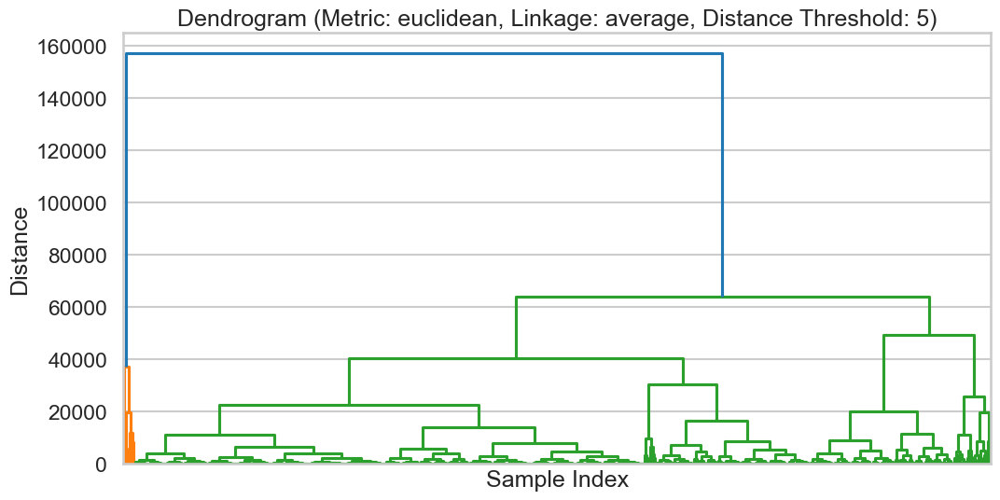

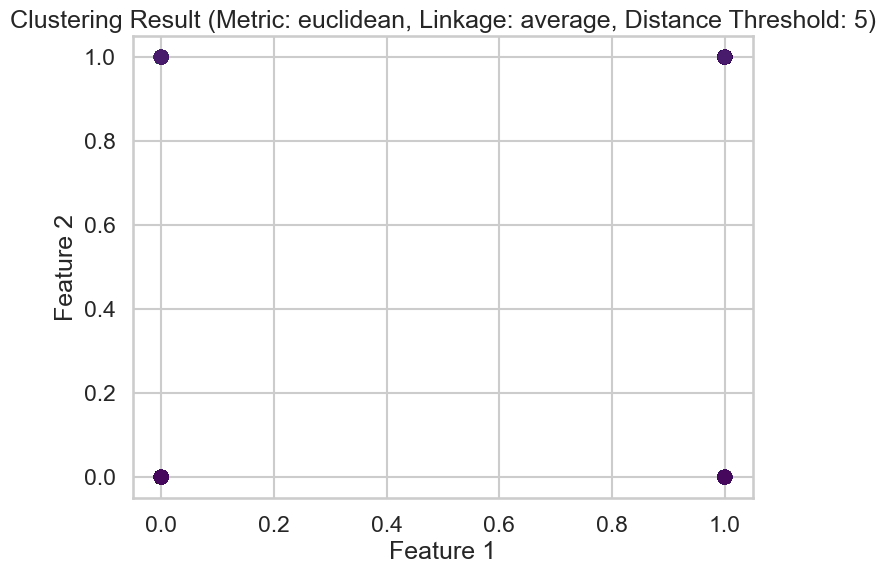

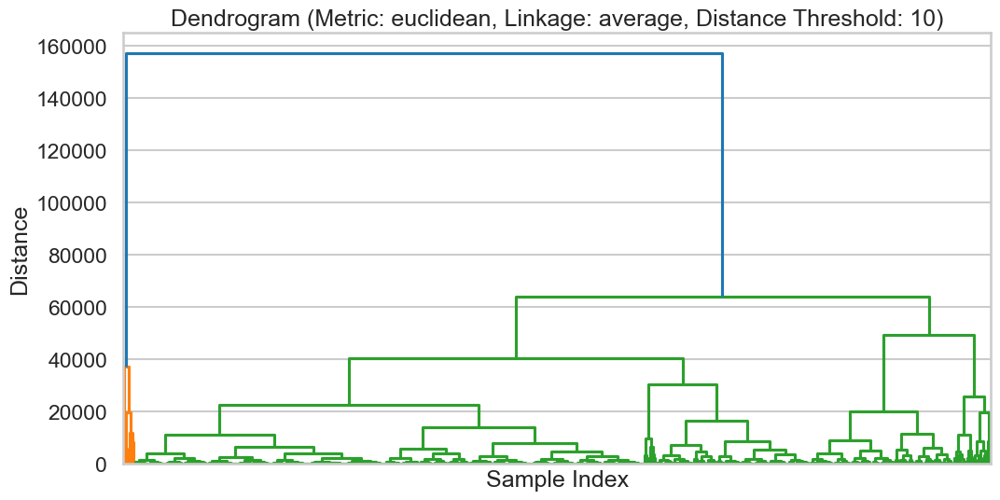

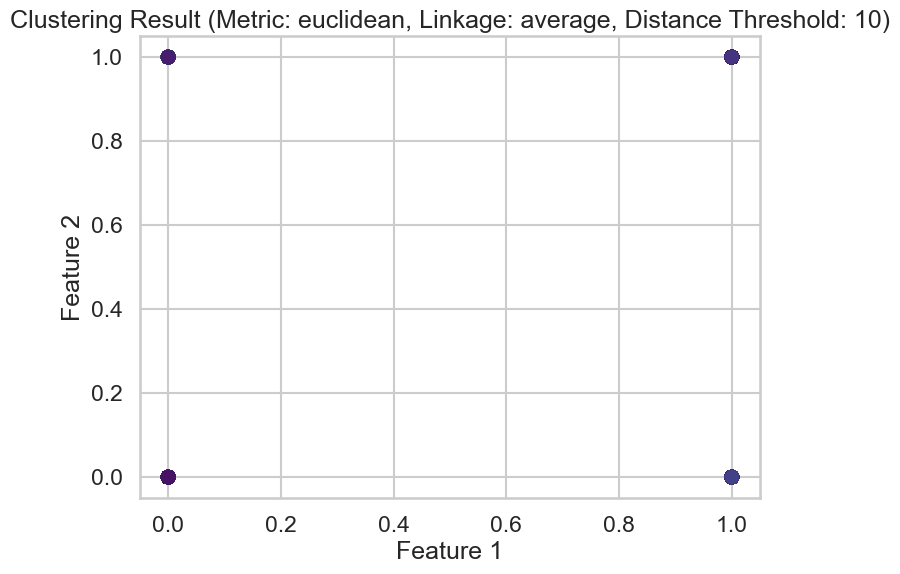

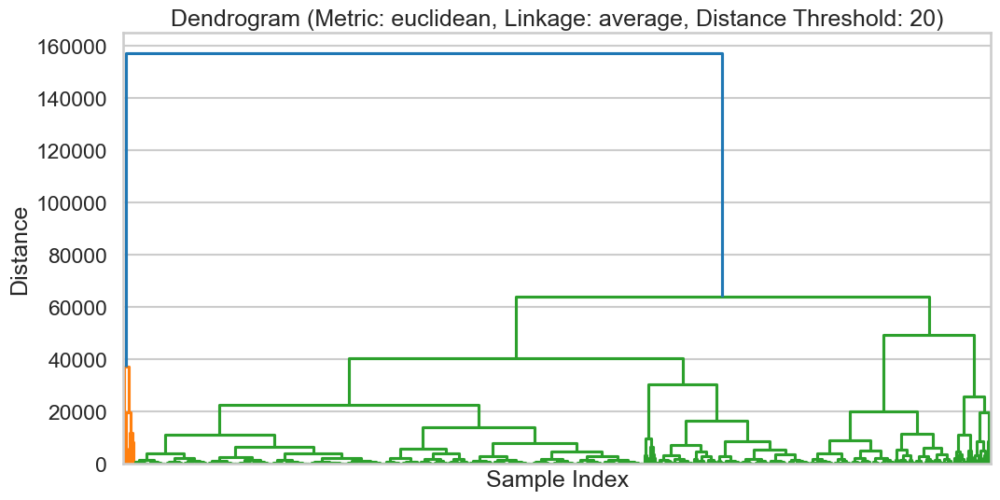

...

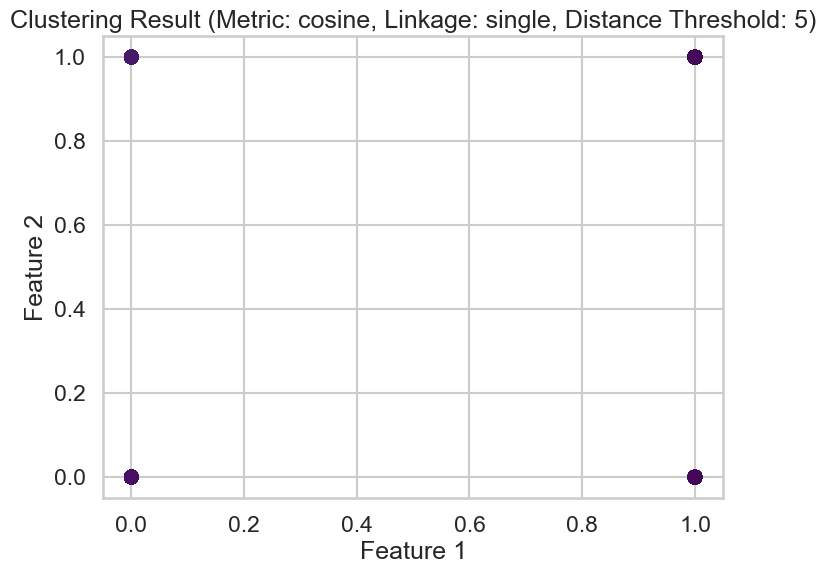

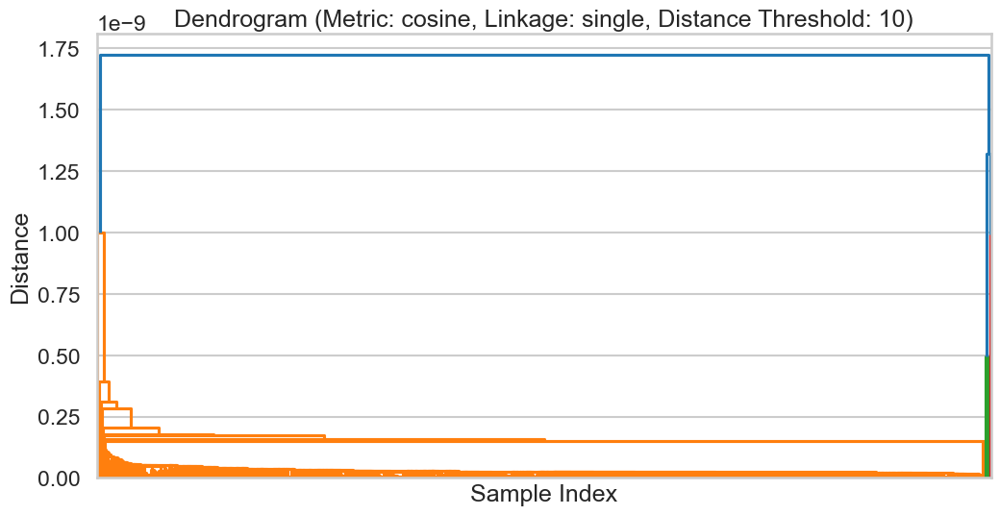

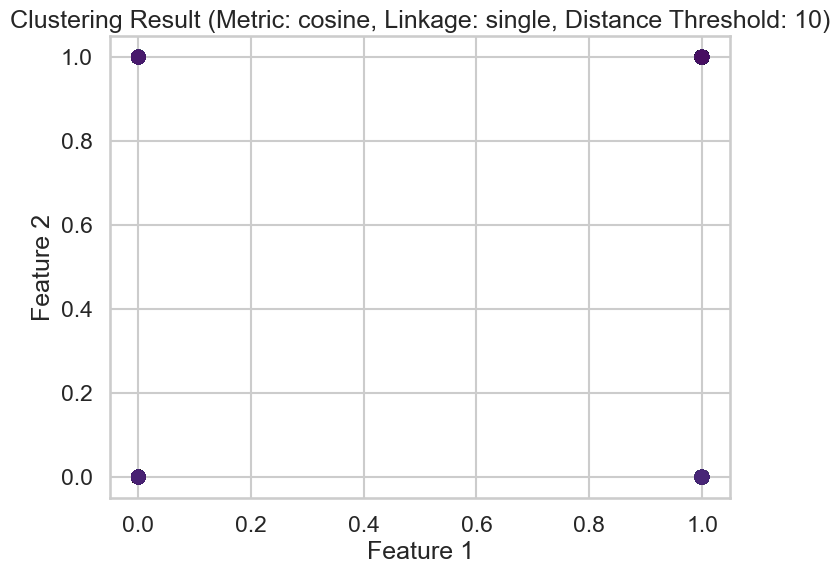

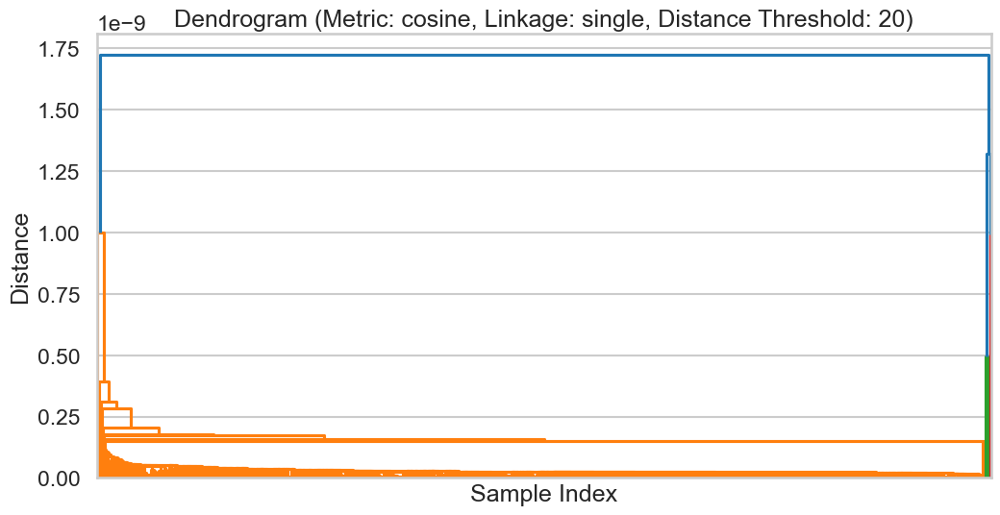

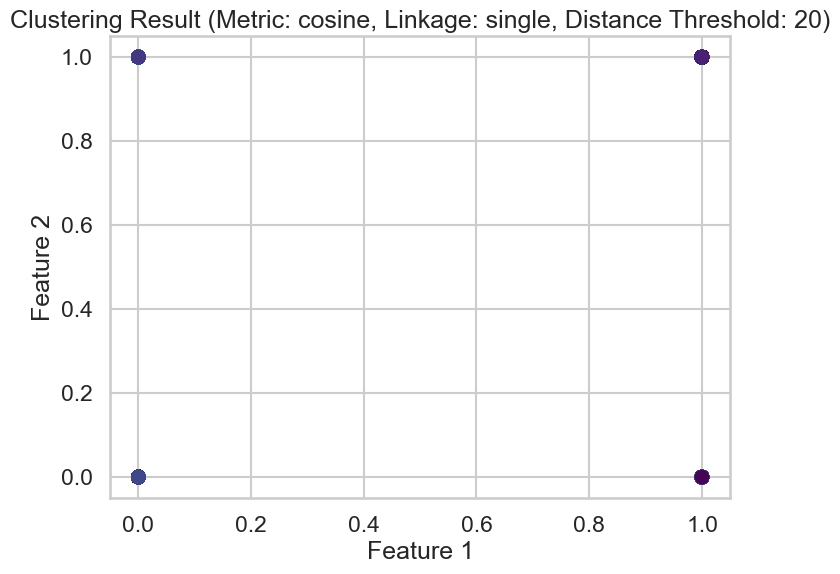

Best parameters: {'Metric': 'euclidean', 'Linkage': 'single', 'Distance Threshold': 20}
Best silhouette score: 0.24126233356440036


In [64]:
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np



# Extract features from the DataFrame
X = df.values

# Define parameters to try
metrics = ['euclidean', 'cityblock', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [5, 10, 20]

# Initialize best silhouette score and parameters
best_silhouette_score = -1
best_params = {}

# Iterate over different combinations of parameters
for metric in metrics:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            # Create AgglomerativeClustering model with specified parameters
            if distance_threshold is not None:
                model = AgglomerativeClustering(n_clusters=None, linkage=linkage_method, distance_threshold=distance_threshold)
            else:
                model = AgglomerativeClustering(n_clusters=3, linkage=linkage_method)  # Adjusted number of clusters to 3

            # Fit the model and predict labels
            labels = model.fit_predict(X)

            # Calculate silhouette score
            silhouette_score_value = silhouette_score(X, labels)

            # Compute linkage matrix
            Z = linkage(X, method=linkage_method, metric=metric)

            # Plot dendrogram
            plt.figure(figsize=(12, 6))
            plt.title(f'Dendrogram (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            dendrogram(Z, no_labels=True)
            plt.xlabel('Sample Index')
            plt.ylabel('Distance')
            plt.show()

            # Display resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
            plt.title(f'Clustering Result (Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.show()

            # Update best parameters and silhouette score if necessary
            if silhouette_score_value > best_silhouette_score:
                best_silhouette_score = silhouette_score_value
                best_params = {'Metric': metric, 'Linkage': linkage_method, 'Distance Threshold': distance_threshold}

# Print the best parameters and silhouette score
print("Best parameters:", best_params)
print("Best silhouette score:", best_silhouette_score)


          ID  Sex  Marital status  Age  Education  Income  Occupation  \
0  100000001    0               0   67          2  124670           1   
1  100000002    1               1   22          1  150773           1   
2  100000003    0               0   49          1   89210           0   
3  100000004    0               0   45          1  171565           1   
4  100000005    0               0   53          1  149031           1   

   Settlement size  
0                2  
1                2  
2                0  
3                1  
4                1  
          ID  Sex  Marital status  Age  Education  Income  Occupation  \
0  100000001    0               0   67          2  124670           1   
1  100000002    1               1   22          1  150773           1   
2  100000003    0               0   49          1   89210           0   
3  100000004    0               0   45          1  171565           1   
4  100000005    0               0   53          1  149031           1 

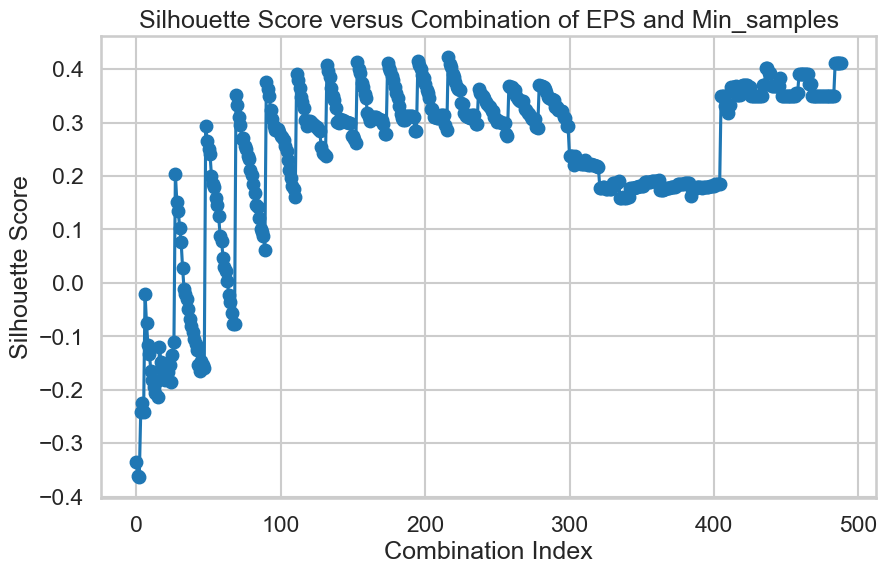

Best parameters:
EPS: 1.2000000000000002
Min_samples: 5
Best silhouette score: 0.4225606832617899


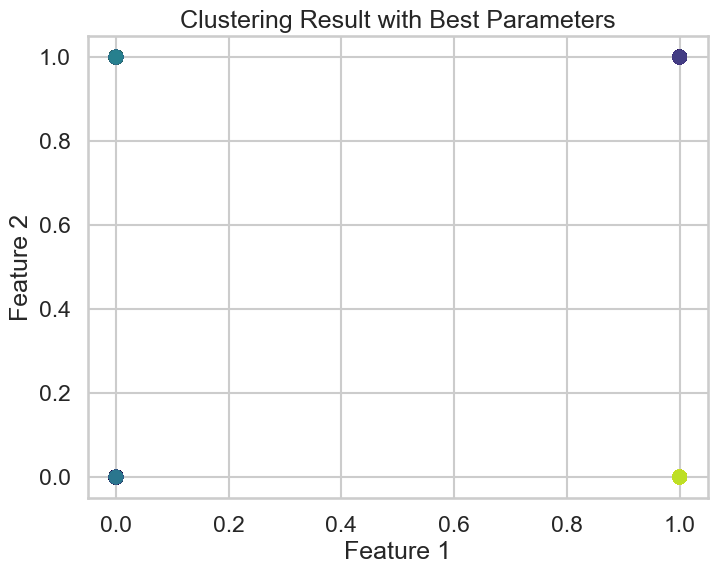

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Load the dataset
df2 = pd.read_csv(r'C:\Users\jessi\Customer data.csv')

# Display the first few rows of the DataFrame
print(df.head())
df2.drop(column_to_drop, axis=1, inplace=True)

print(df.head())

# Extract features
X = df2.values

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Define EPS and Min_samples ranges
eps_range = np.arange(0.1, 3.1, 0.1)
min_samples_range = range(5, 26)

# Initialize variables to store the best silhouette score and corresponding parameters
best_silhouette_score = -1
best_eps = None
best_min_samples = None

# Initialize lists to store silhouette scores
silhouette_scores = []

# Iterate over different combinations of EPS and Min_samples
for eps in eps_range:
    for min_samples in min_samples_range:
        # Create DBSCAN model with specified parameters
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        
        # Fit the model and predict clusters
        labels = dbscan.fit_predict(X_normalized)
        
        # Check the number of unique labels
        unique_labels = np.unique(labels)
        if len(unique_labels) < 2:
            print(f"Ignoring combination: EPS={eps}, Min_samples={min_samples}. Not enough unique labels.")
            continue
        
        # Compute silhouette score
        silhouette_avg = silhouette_score(X_normalized, labels)
        silhouette_scores.append(silhouette_avg)
        
        # Update best silhouette score and parameters if necessary
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_eps = eps
            best_min_samples = min_samples

# Plot silhouette score versus variation in EPS and Min_samples
plt.figure(figsize=(10, 6))
plt.plot(range(len(silhouette_scores)), silhouette_scores, marker='o')
plt.xlabel('Combination Index')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score versus Combination of EPS and Min_samples')
plt.grid(True)
plt.show()

print("Best parameters:")
print("EPS:", best_eps)
print("Min_samples:", best_min_samples)
print("Best silhouette score:", best_silhouette_score)

# Plot resulting clusters for the best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(X_normalized)

# Check the number of unique labels again
unique_labels = np.unique(best_labels)
if len(unique_labels) < 2:
    print("The best combination resulted in not enough unique labels for clustering.")
else:
    plt.figure(figsize=(8, 6))
    plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='viridis')
    plt.title('Clustering Result with Best Parameters')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


Number of features before preprocessing: 7
Number of features after preprocessing: 7


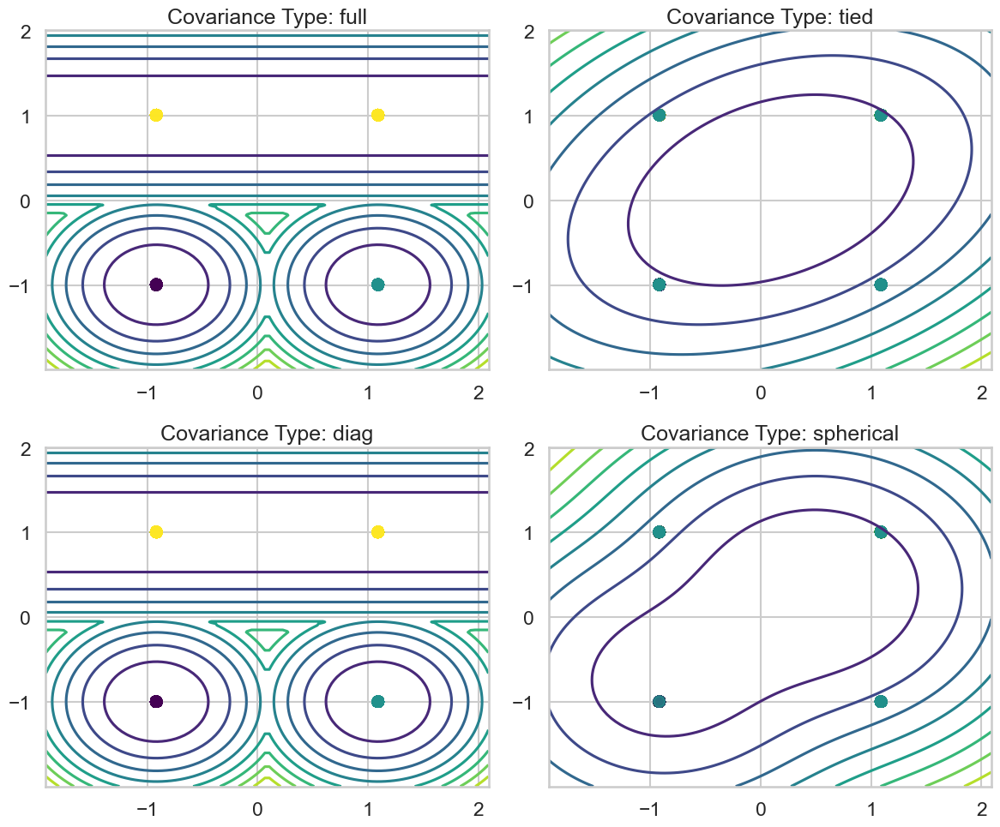

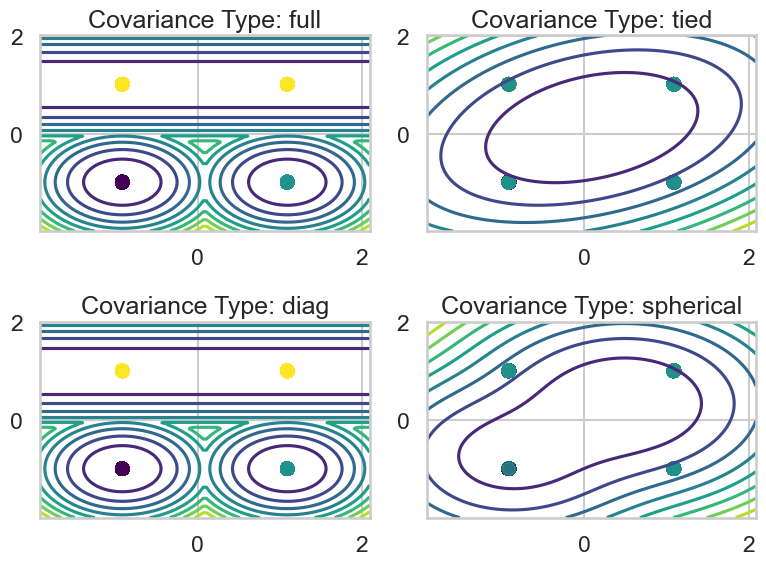

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Load or create your dataset (replace this with your actual data loading code)
# For demonstration purposes, let's assume df2 is your DataFrame containing the data
# df2 = ...

# Check the number of features in the DataFrame
print("Number of features before preprocessing:", df2.shape[1])

# If there is an extra feature, remove it
if df2.shape[1] > 7:
    df2 = df2.iloc[:, :7]  # Keep only the first 7 features

# Check the number of features after preprocessing
print("Number of features after preprocessing:", df2.shape[1])

# Now you can use df2 as input to your Gaussian Mixture Model

# Extract features
X = df2.values

# Normalize the data
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Define covariance types to try
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Initialize subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Iterate over different covariance types
for i, cov_type in enumerate(covariance_types):
    # Create Gaussian Mixture model with specified covariance type
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    
    # Fit the model
    gmm.fit(X_normalized)
    
    # Generate meshgrid for contour plot
    x_min, x_max = X_normalized[:, 0].min() - 1, X_normalized[:, 0].max() + 1
    y_min, y_max = X_normalized[:, 1].min() - 1, X_normalized[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    
    # Concatenate meshgrid coordinates to create 7-feature input (since we have 7 features now)
    grid_data = np.c_[xx.ravel(), yy.ravel(), np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()), 
                      np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())]
    
    # Compute log probabilities
    Z = -gmm.score_samples(grid_data)
    Z = Z.reshape(xx.shape)
    
    # Plot contour plot for the current covariance type
    ax = axs[i // 2, i % 2]
    ax.contour(xx, yy, Z, levels=np.linspace(Z.min(), Z.max(), 10), cmap='viridis')
    ax.scatter(X_normalized[:, 0], X_normalized[:, 1], c=gmm.predict(X_normalized), cmap='viridis', alpha=0.5)
    ax.set_title(f'Covariance Type: {cov_type}')

plt.tight_layout()
plt.show()

# Initialize subplots with a smaller size
fig, axs = plt.subplots(2, 2, figsize=(8, 6))  # Adjust the figsize as needed

# Iterate over different covariance types
for i, cov_type in enumerate(covariance_types):
    # Create Gaussian Mixture model with specified covariance type
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    
    # Fit the model
    gmm.fit(X_normalized)
    
    # Generate meshgrid for contour plot
    x_min, x_max = X_normalized[:, 0].min() - 1, X_normalized[:, 0].max() + 1
    y_min, y_max = X_normalized[:, 1].min() - 1, X_normalized[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    
    # Concatenate meshgrid coordinates to create 7-feature input (since we have 7 features now)
    grid_data = np.c_[xx.ravel(), yy.ravel(), np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()), 
                      np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())]
    
    # Compute log probabilities
    Z = -gmm.score_samples(grid_data)
    Z = Z.reshape(xx.shape)
    
    # Plot contour plot for the current covariance type
    ax = axs[i // 2, i % 2]
    ax.contour(xx, yy, Z, levels=np.linspace(Z.min(), Z.max(), 10), cmap='viridis')
    ax.scatter(X_normalized[:, 0], X_normalized[:, 1], c=gmm.predict(X_normalized), cmap='viridis', alpha=0.5)
    ax.set_title(f'Covariance Type: {cov_type}')

plt.tight_layout()
plt.show()



In [ ]:
# 